In [1]:
import tensorflow as tf
tf.__version__

'2.9.0'

# Introduction to convolutional neural networks with tensorflow

Computer vision is a practice of writing algoritms which can discover patterns in visual data.

## Get the data

In [3]:
import zipfile

# Unzip the downloaded file
zip_ref = zipfile.ZipFile("pizza_steak.zip")
zip_ref.extractall()
zip_ref.close()

FileNotFoundError: [Errno 2] No such file or directory: 'pizza_steak.zip'

### Inspect the data

In [ ]:
!ls pizza_steak

test  train


In [ ]:
!ls pizza_steak/train/

pizza steak


In [ ]:
!ls pizza_steak/train/steak

1000205.jpg 1647351.jpg 2238681.jpg 2824680.jpg 3375959.jpg 417368.jpg
100135.jpg  1650002.jpg 2238802.jpg 2825100.jpg 3381560.jpg 4176.jpg
101312.jpg  165639.jpg  2254705.jpg 2826987.jpg 3382936.jpg 42125.jpg
1021458.jpg 1658186.jpg 225990.jpg  2832499.jpg 3386119.jpg 421476.jpg
1032846.jpg 1658443.jpg 2260231.jpg 2832960.jpg 3388717.jpg 421561.jpg
10380.jpg   165964.jpg  2268692.jpg 285045.jpg  3389138.jpg 438871.jpg
1049459.jpg 167069.jpg  2271133.jpg 285147.jpg  3393547.jpg 43924.jpg
1053665.jpg 1675632.jpg 227576.jpg  2855315.jpg 3393688.jpg 440188.jpg
1068516.jpg 1678108.jpg 2283057.jpg 2856066.jpg 3396589.jpg 442757.jpg
1068975.jpg 168006.jpg  2286639.jpg 2859933.jpg 339891.jpg  443210.jpg
1081258.jpg 1682496.jpg 2287136.jpg 286219.jpg  3417789.jpg 444064.jpg
1090122.jpg 1684438.jpg 2291292.jpg 2862562.jpg 3425047.jpg 444709.jpg
1093966.jpg 168775.jpg  229323.jpg  2865730.jpg 3434983.jpg 447557.jpg
1098844.jpg 1697339.jpg 2300534.jpg 2878151.jpg 3435358.jpg 461187.jpg
1100074.jp

In [ ]:
import os

# Walk through the file and list the number of files
for dirpath, dirnames, filenames in os.walk("pizza_steak"):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'")

There are 2 directories and 0 images in 'pizza_steak'
There are 2 directories and 0 images in 'pizza_steak/test'
There are 0 directories and 250 images in 'pizza_steak/test/steak'
There are 0 directories and 250 images in 'pizza_steak/test/pizza'
There are 2 directories and 0 images in 'pizza_steak/train'
There are 0 directories and 750 images in 'pizza_steak/train/steak'
There are 0 directories and 750 images in 'pizza_steak/train/pizza'


In [ ]:
# Another way to find out how many images in a file
num_steak_images_train = len(os.listdir("pizza_steak/train/steak"))
num_steak_images_train

750

Visualise images

In [ ]:
import pathlib
import numpy as np
data_dir = pathlib.Path("pizza_steak/train")
class_names = np.array(sorted([item.name for item in data_dir.glob("*")])) # Create a list of classnames from sub_directories
print(class_names)

['pizza' 'steak']


In [ ]:
# Visualise images
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

def view_random_image(target_dir,target_class):
  # Setup target directory
  target_folder = target_dir+target_class

  #Get random image path
  random_image = random.sample(os.listdir(target_folder),1)
  print(random_image)

  #Read in the image and plot it using matplotlib
  img = mpimg.imread(target_folder+"/"+random_image[0])
  plt.imshow(img)
  plt.title(target_class)
  plt.axis("off")
  plt.show()

  print(f"Image shape {img.shape}") # Shows the shape of the image

  return img


['1346387.jpg']


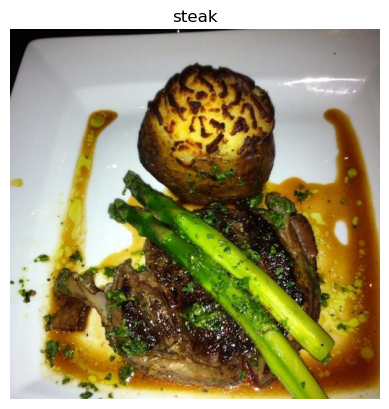

Image shape (512, 512, 3)
['676189.jpg']


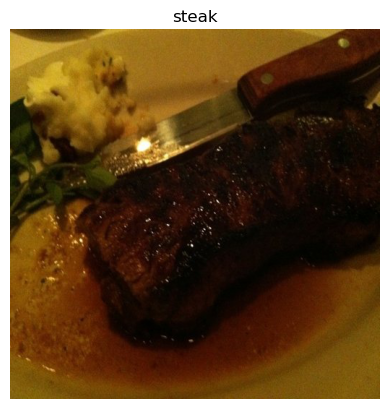

Image shape (512, 512, 3)
['1163977.jpg']


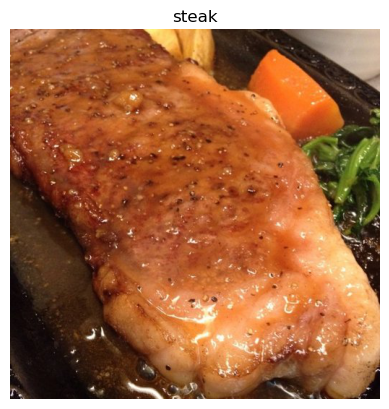

Image shape (512, 512, 3)
['2538000.jpg']


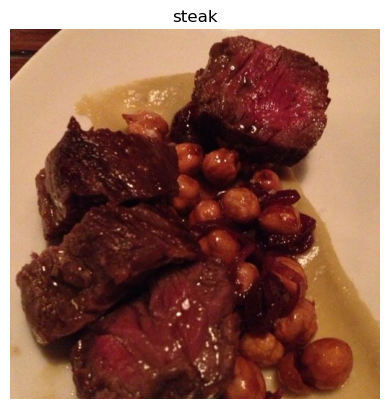

Image shape (512, 512, 3)
['2989882.jpg']


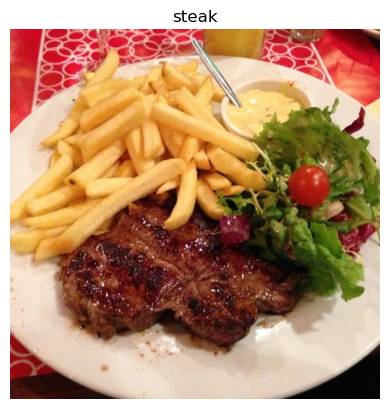

Image shape (512, 512, 3)
['3528458.jpg']


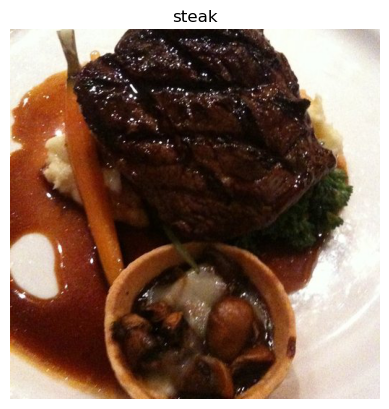

Image shape (512, 512, 3)
['2916967.jpg']


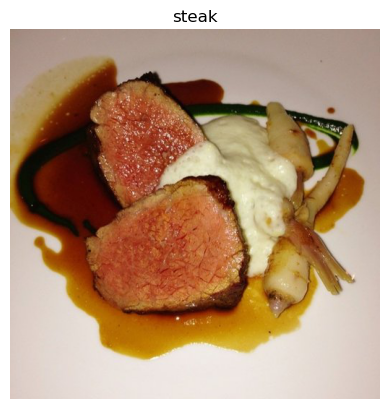

Image shape (512, 512, 3)
['3553911.jpg']


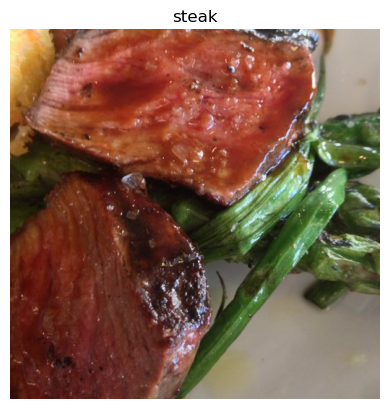

Image shape (512, 512, 3)
['767442.jpg']


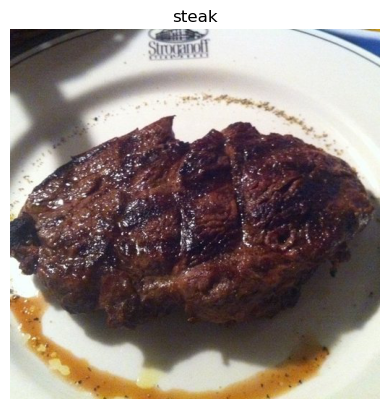

Image shape (512, 512, 3)
['3895825.jpg']


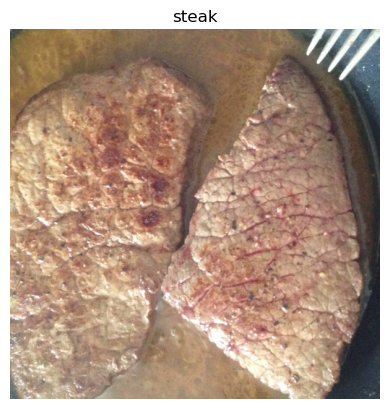

Image shape (512, 512, 3)


In [ ]:
# View random image from training dataset
for i in range(10):
  img = view_random_image(target_dir="pizza_steak/train/",
                        target_class="steak")

['3397336.jpg']


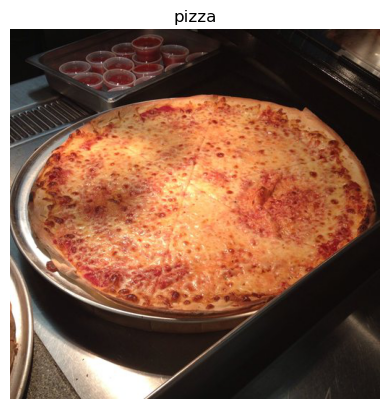

Image shape (512, 512, 3)
['1137400.jpg']


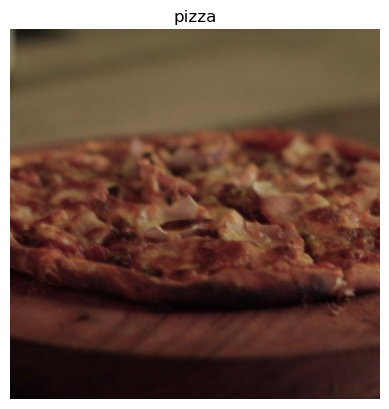

Image shape (512, 512, 3)
['3148119.jpg']


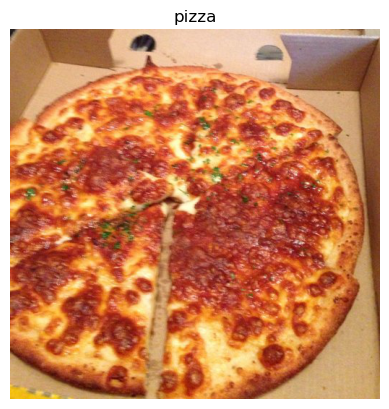

Image shape (512, 512, 3)
['3333459.jpg']


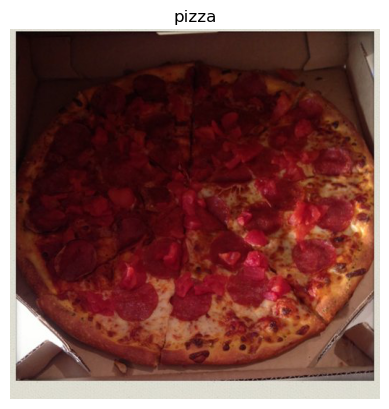

Image shape (512, 512, 3)
['3882444.jpg']


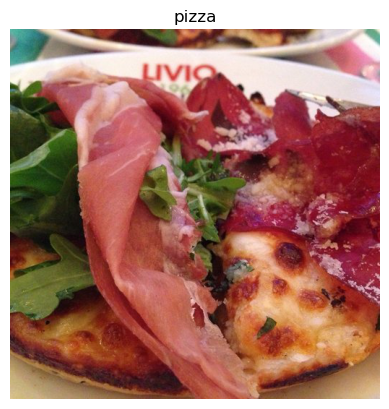

Image shape (512, 512, 3)
['2462190.jpg']


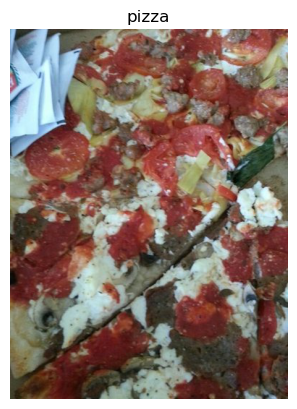

Image shape (512, 384, 3)
['2467990.jpg']


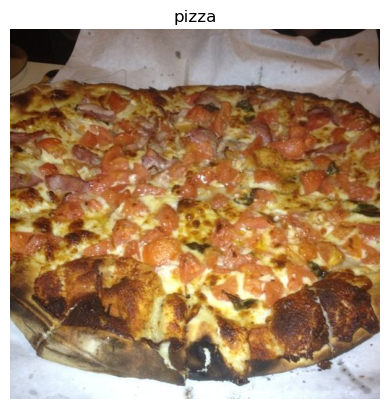

Image shape (512, 512, 3)
['2112757.jpg']


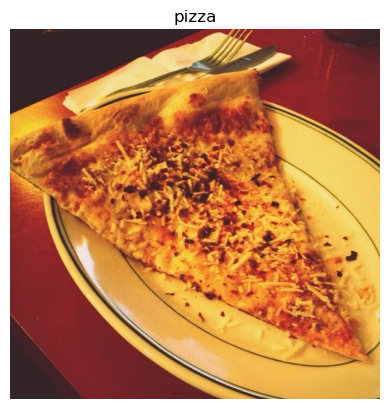

Image shape (512, 512, 3)
['2951831.jpg']


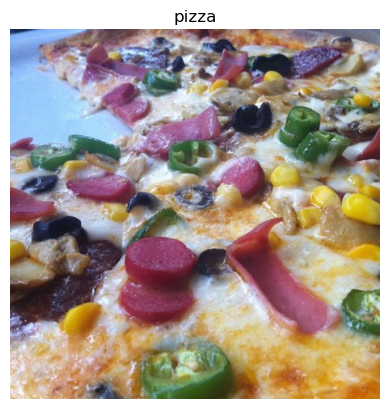

Image shape (512, 512, 3)
['765799.jpg']


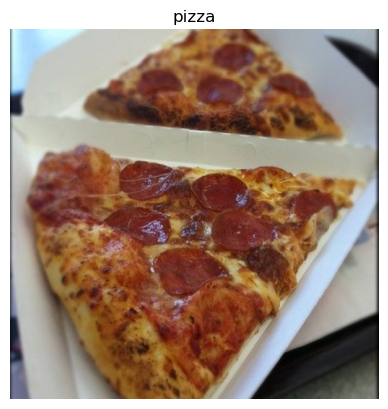

Image shape (512, 511, 3)


In [ ]:
for i in range(10):
  img = view_random_image(target_dir="pizza_steak/train/",
                        target_class="pizza")

In [ ]:
img = tf.cast(tf.constant(img),dtype=tf.float32)
img

Metal device set to: Apple M1

systemMemory: 8.00 GB
maxCacheSize: 2.67 GB



2023-06-07 22:35:18.113922: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-06-07 22:35:18.115720: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


<tf.Tensor: shape=(512, 511, 3), dtype=float32, numpy=
array([[[103., 133., 131.],
        [135., 165., 163.],
        [168., 200., 199.],
        ...,
        [ 83.,  92.,  91.],
        [ 56.,  62.,  62.],
        [ 39.,  45.,  43.]],

       [[103., 133., 131.],
        [135., 165., 163.],
        [168., 200., 199.],
        ...,
        [ 83.,  92.,  91.],
        [ 56.,  62.,  62.],
        [ 39.,  45.,  43.]],

       [[103., 133., 131.],
        [135., 165., 163.],
        [168., 200., 199.],
        ...,
        [ 83.,  92.,  91.],
        [ 57.,  63.,  63.],
        [ 39.,  45.,  43.]],

       ...,

       [[ 56.,  64.,  83.],
        [ 71.,  79.,  98.],
        [ 89.,  97., 118.],
        ...,
        [ 66.,  67.,  62.],
        [ 47.,  48.,  43.],
        [ 36.,  37.,  32.]],

       [[ 57.,  65.,  84.],
        [ 72.,  80.,  99.],
        [ 90.,  98., 119.],
        ...,
        [ 67.,  68.,  63.],
        [ 47.,  48.,  43.],
        [ 37.,  38.,  33.]],

       [[ 58.,  6

In [ ]:
img.shape

TensorShape([512, 511, 3])

In [ ]:
# Normalize the data
img/255.

<tf.Tensor: shape=(512, 511, 3), dtype=float32, numpy=
array([[[0.40392157, 0.52156866, 0.5137255 ],
        [0.5294118 , 0.64705884, 0.6392157 ],
        [0.65882355, 0.78431374, 0.78039217],
        ...,
        [0.3254902 , 0.36078432, 0.35686275],
        [0.21960784, 0.24313726, 0.24313726],
        [0.15294118, 0.1764706 , 0.16862746]],

       [[0.40392157, 0.52156866, 0.5137255 ],
        [0.5294118 , 0.64705884, 0.6392157 ],
        [0.65882355, 0.78431374, 0.78039217],
        ...,
        [0.3254902 , 0.36078432, 0.35686275],
        [0.21960784, 0.24313726, 0.24313726],
        [0.15294118, 0.1764706 , 0.16862746]],

       [[0.40392157, 0.52156866, 0.5137255 ],
        [0.5294118 , 0.64705884, 0.6392157 ],
        [0.65882355, 0.78431374, 0.78039217],
        ...,
        [0.3254902 , 0.36078432, 0.35686275],
        [0.22352941, 0.24705882, 0.24705882],
        [0.15294118, 0.1764706 , 0.16862746]],

       ...,

       [[0.21960784, 0.2509804 , 0.3254902 ],
        [0.27

## An end-to-end exsmple

build a convolutional neural network

* Load image
* Pre-process images
* Build CNN
* Compile CNN
* Fit CNN

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

tf.random.set_seed(42)

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_dir="pizza_steak/train/"
test_dir="pizza_steak/test/"

train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=32,
                                               target_size=(224,224),
                                               class_mode="binary",
                                               seed=42)
test_data = test_datagen.flow_from_directory(test_dir,
                                             batch_size=32,
                                             target_size=(224,224),
                                             class_mode="binary",
                                             seed=42)

model_1 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation="relu",
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation="relu"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation="relu"),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)                                                                                                                                     
])

model_1.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])
history_1 = model_1.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/5


2023-06-07 22:35:19.187259: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-06-07 22:35:19.483237: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.5610 - accuracy: 0.7113

2023-06-07 22:35:25.191149: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 7s 139ms/step - loss: 0.5610 - accuracy: 0.7113 - val_loss: 0.4393 - val_accuracy: 0.7780
Epoch 2/5
47/47 [==============================] - 6s 127ms/step - loss: 0.4301 - accuracy: 0.8073 - val_loss: 0.3805 - val_accuracy: 0.8520
Epoch 3/5
47/47 [==============================] - 6s 128ms/step - loss: 0.4101 - accuracy: 0.8240 - val_loss: 0.3142 - val_accuracy: 0.8660
Epoch 4/5
47/47 [==============================] - 6s 125ms/step - loss: 0.3798 - accuracy: 0.8387 - val_loss: 0.3162 - val_accuracy: 0.8820
Epoch 5/5
47/47 [==============================] - 6s 125ms/step - loss: 0.3374 - accuracy: 0.8533 - val_loss: 0.3800 - val_accuracy: 0.8260


In [ ]:
# model summary
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 10)      280       
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 10)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 10)      910       
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 53, 53, 10)       0         
 2D)                                                    

## Use the same model as before

In [ ]:
# Set random seed
tf.random.set_seed(42)

# Create a model to replicate the TensorFlow Playground model
model_2 = tf.keras.Sequential([
  tf.keras.layers.Flatten(input_shape=(224, 224, 3)),
  tf.keras.layers.Dense(4, activation='relu'),
  tf.keras.layers.Dense(4, activation='relu'),
  tf.keras.layers.Dense(1, activation=tf.keras.activations.sigmoid)
])

# Compile the model
model_2.compile(loss=tf.keras.losses.BinaryCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

# Fit the model
history_2 = model_2.fit(train_data, 
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data, 
                        validation_steps=len(test_data))

Epoch 1/5


2023-06-07 22:35:50.940172: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.9076 - accuracy: 0.5033

2023-06-07 22:35:54.311508: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 5s 87ms/step - loss: 0.9076 - accuracy: 0.5033 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/5
47/47 [==============================] - 4s 84ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 3/5
47/47 [==============================] - 4s 84ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 4/5
47/47 [==============================] - 4s 84ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 5/5
47/47 [==============================] - 4s 84ms/step - loss: 0.6932 - accuracy: 0.5000 - val_loss: 0.6932 - val_accuracy: 0.5000


In [ ]:
model_2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 150528)            0         
                                                                 
 dense_1 (Dense)             (None, 4)                 602116    
                                                                 
 dense_2 (Dense)             (None, 4)                 20        
                                                                 
 dense_3 (Dense)             (None, 1)                 5         
                                                                 
Total params: 602,141
Trainable params: 602,141
Non-trainable params: 0
_________________________________________________________________


In [ ]:
tf.random.set_seed(42)
model_3 = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(224,224,3)),
    tf.keras.layers.Dense(100,activation=tf.keras.activations.relu),
    tf.keras.layers.Dense(100,activation=tf.keras.activations.relu),
    tf.keras.layers.Dense(100,activation=tf.keras.activations.relu),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])
model_3.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                metrics=['accuracy'])
history_3 = model_3.fit(train_data,
                          epochs=5,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/5


2023-06-07 22:36:11.558820: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 3.3578 - accuracy: 0.6233

2023-06-07 22:36:15.105981: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 5s 90ms/step - loss: 3.3578 - accuracy: 0.6233 - val_loss: 2.7386 - val_accuracy: 0.5480
Epoch 2/5
47/47 [==============================] - 4s 89ms/step - loss: 1.1906 - accuracy: 0.6993 - val_loss: 1.1580 - val_accuracy: 0.6960
Epoch 3/5
47/47 [==============================] - 4s 85ms/step - loss: 0.5898 - accuracy: 0.7727 - val_loss: 0.4809 - val_accuracy: 0.7780
Epoch 4/5
47/47 [==============================] - 4s 87ms/step - loss: 0.7893 - accuracy: 0.7167 - val_loss: 0.8920 - val_accuracy: 0.7100
Epoch 5/5
47/47 [==============================] - 4s 87ms/step - loss: 0.8713 - accuracy: 0.7273 - val_loss: 0.6157 - val_accuracy: 0.7340


In [ ]:
model_3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 150528)            0         
                                                                 
 dense_4 (Dense)             (None, 100)               15052900  
                                                                 
 dense_5 (Dense)             (None, 100)               10100     
                                                                 
 dense_6 (Dense)             (None, 100)               10100     
                                                                 
 dense_7 (Dense)             (None, 1)                 101       
                                                                 
Total params: 15,073,201
Trainable params: 15,073,201
Non-trainable params: 0
_________________________________________________________________


### Summary:
Regular neural network models are good for any tensors to be trained, but with computer vision, its better to use CNN as no other method of neural network can match its potential

['2832960.jpg']


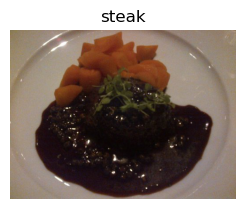

Image shape (384, 512, 3)
['918506.jpg']


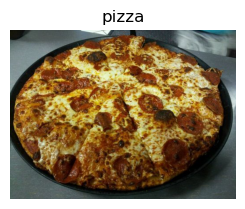

Image shape (384, 512, 3)


In [ ]:
# Visualize the data
plt.figure()
plt.subplot(1,2,1)
steak_image = view_random_image("pizza_steak/train/","steak")
plt.subplot(1,2,2)
pizza_image= view_random_image("pizza_steak/train/","pizza")

### Preprocess the data

In [ ]:
# Define directory dataset paths
train_dir = "pizza_steak/train/"
test_dir = "pizza_steak/test/"

Turn the data into batches

In [ ]:
# Create train and test data generators and rescale the data
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255)
test_data_gen=ImageDataGenerator(rescale=1./255)

In [ ]:
# Load images from directories and turn them into batches
train_data = train_datagen.flow_from_directory(directory=train_dir,
                                               target_size=(224,224),
                                               class_mode="binary",
                                               batch_size=32)

test_data = test_data_gen.flow_from_directory(directory=test_dir,
                                               target_size=(224,224),
                                               class_mode="binary",
                                               batch_size=32)

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


In [ ]:
# Get samples of train data batch
images, labels = train_data.next()  # get the next batch of images/lables
len(images),len(labels)

(32, 32)

In [ ]:
# Get the firsy two images
images[:2],images[0].shape

(array([[[[0.47058827, 0.40784317, 0.34509805],
          [0.4784314 , 0.427451  , 0.3647059 ],
          [0.48627454, 0.43529415, 0.37254903],
          ...,
          [0.8313726 , 0.70980394, 0.48627454],
          [0.8431373 , 0.73333335, 0.5372549 ],
          [0.87843144, 0.7725491 , 0.5882353 ]],
 
         [[0.50980395, 0.427451  , 0.36078432],
          [0.5058824 , 0.42352945, 0.35686275],
          [0.5137255 , 0.4431373 , 0.3647059 ],
          ...,
          [0.82745105, 0.7058824 , 0.48235297],
          [0.82745105, 0.70980394, 0.5058824 ],
          [0.8431373 , 0.73333335, 0.5372549 ]],
 
         [[0.5254902 , 0.427451  , 0.34901962],
          [0.5372549 , 0.43921572, 0.36078432],
          [0.5372549 , 0.45098042, 0.36078432],
          ...,
          [0.82745105, 0.7019608 , 0.4784314 ],
          [0.82745105, 0.7058824 , 0.49411768],
          [0.8352942 , 0.7176471 , 0.5137255 ]],
 
         ...,
 
         [[0.77647066, 0.5647059 , 0.2901961 ],
          [0.78039

In [ ]:
labels

array([1., 1., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 1., 0., 0., 0., 1.,
       1., 0., 1., 0., 1., 1., 1., 0., 0., 0., 0., 0., 1., 0., 1.],
      dtype=float32)

(<matplotlib.image.AxesImage at 0x299a2bd60>, 1.0)

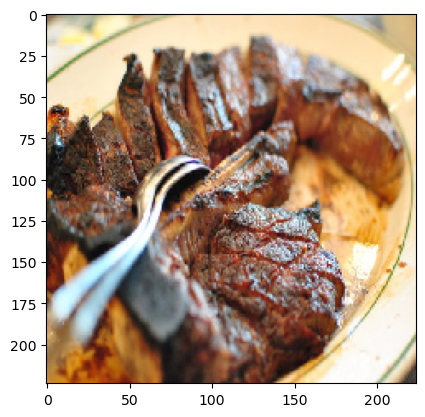

In [ ]:
plt.imshow(images[0]),labels[0]

### Create a model

Start with baseline

> In deep learning there is almost infinite architectures you could create, one of best way to start is to start simple and see if it works and increase complexity if it works

In [ ]:
# 3-Layers Convolutional neural network
model_4 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           strides=1,
                           padding="valid",
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           strides=1,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           strides=1,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])

In [ ]:
# Compile the model
model_4.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                metrics=["accuracy","mae"])

In [ ]:
# Fit the model
history_4 = model_4.fit(train_data,
            epochs=5,
            steps_per_epoch=len(train_data),
            validation_data = test_data,
            validation_steps = len(test_data))

Epoch 1/5


2023-06-07 22:36:34.033173: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 1.6003 - accuracy: 0.5980 - mae: 0.4646

2023-06-07 22:36:40.293818: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 8s 151ms/step - loss: 1.6003 - accuracy: 0.5980 - mae: 0.4646 - val_loss: 0.5639 - val_accuracy: 0.7660 - val_mae: 0.4191
Epoch 2/5
47/47 [==============================] - 7s 147ms/step - loss: 0.5157 - accuracy: 0.7680 - mae: 0.3388 - val_loss: 0.4707 - val_accuracy: 0.8140 - val_mae: 0.3476
Epoch 3/5
47/47 [==============================] - 7s 146ms/step - loss: 0.3907 - accuracy: 0.8380 - mae: 0.2665 - val_loss: 0.4783 - val_accuracy: 0.7720 - val_mae: 0.2914
Epoch 4/5
47/47 [==============================] - 7s 147ms/step - loss: 0.2564 - accuracy: 0.9047 - mae: 0.1824 - val_loss: 0.3832 - val_accuracy: 0.8240 - val_mae: 0.2484
Epoch 5/5
47/47 [==============================] - 7s 147ms/step - loss: 0.1216 - accuracy: 0.9633 - mae: 0.0922 - val_loss: 0.4442 - val_accuracy: 0.8080 - val_mae: 0.2230


### Evaluate the model

<AxesSubplot: >

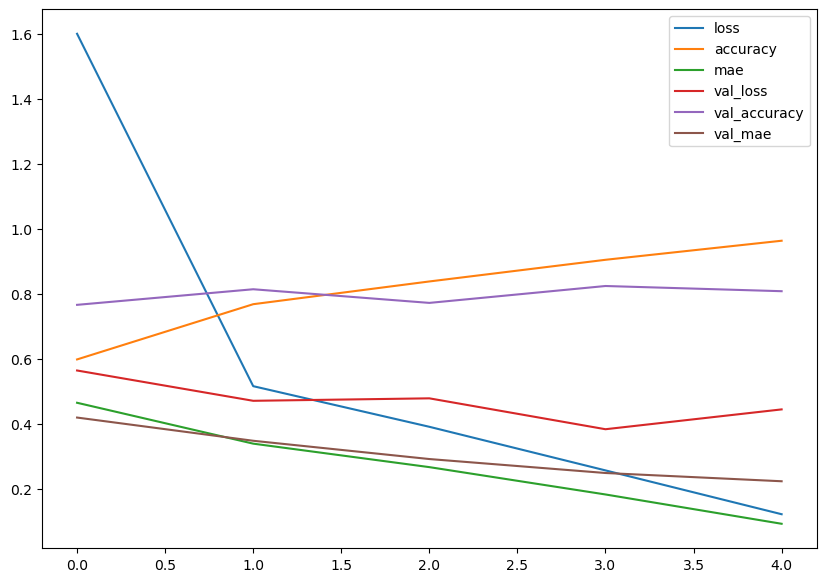

In [ ]:
import pandas as pd
pd.DataFrame(history_4.history).plot(figsize=(10,7))

In [ ]:
# Plot the curves seperately
def plot_loss_curves(history):
    
    # returns seperate loss curves
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]

    accuracy = history.history["accuracy"]
    val_accuracy = history.history["val_accuracy"]

    epochs = range(len(history.history["loss"]))

    #plot loss:
    plt.figure(figsize=(15,8))
    plt.subplot(1,2,1)
    plt.plot(epochs,loss,label="training_loss")
    plt.plot(epochs,val_loss,label="val_loss")
    plt.title("loss")
    plt.xlabel("epochs")
    plt.legend()
    #plt.show()

    #Plot the accuracy
    plt.subplot(1,2,2)
    plt.plot(epochs,accuracy,label="training_accuracy")
    plt.plot(epochs,val_accuracy,label="val_accuracy")
    plt.title("accuracy")
    plt.xlabel("epochs")
    plt.legend()
    #plt.show()

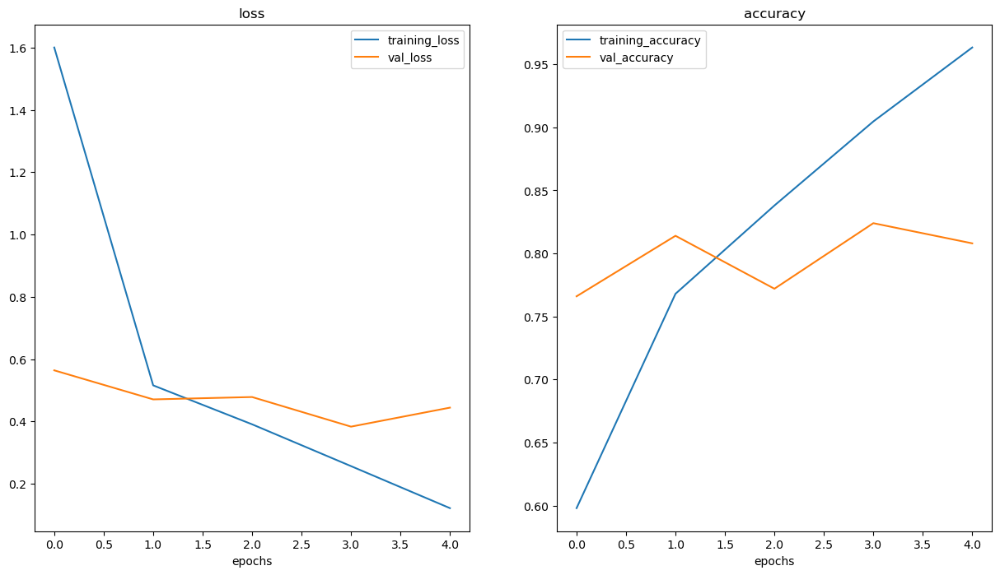

In [ ]:
plot_loss_curves(history_4)

### Ways to reduce overfitting
* increase the number of Conv2D layers
* Increase the number of Conv2D filters
* Add another dense layer to the output of our flattened layer

* Add data augmentation
* Add regularization layers(such as MaxPool2D)
* Add more data

In [ ]:
# Create a model
model_5 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])
# Compile the model
model_5.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])
# Fit the model
history_5 = model_5.fit(train_data,
                        epochs=10,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Epoch 1/10


2023-06-07 22:37:10.138094: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.6152 - accuracy: 0.6720

2023-06-07 22:37:13.898847: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 5s 96ms/step - loss: 0.6152 - accuracy: 0.6720 - val_loss: 0.4501 - val_accuracy: 0.8040
Epoch 2/10
47/47 [==============================] - 5s 102ms/step - loss: 0.4586 - accuracy: 0.7933 - val_loss: 0.3860 - val_accuracy: 0.8240
Epoch 3/10
47/47 [==============================] - 5s 100ms/step - loss: 0.4308 - accuracy: 0.8140 - val_loss: 0.3630 - val_accuracy: 0.8340
Epoch 4/10
47/47 [==============================] - 4s 90ms/step - loss: 0.4324 - accuracy: 0.8000 - val_loss: 0.3559 - val_accuracy: 0.8540
Epoch 5/10
47/47 [==============================] - 4s 94ms/step - loss: 0.3793 - accuracy: 0.8333 - val_loss: 0.3346 - val_accuracy: 0.8500
Epoch 6/10
47/47 [==============================] - 5s 95ms/step - loss: 0.3523 - accuracy: 0.8553 - val_loss: 0.3386 - val_accuracy: 0.8720
Epoch 7/10
47/47 [==============================] - 4s 94ms/step - loss: 0.3278 - accuracy: 0.8653 - val_loss: 0.3170 - val_accuracy: 0.8700
Epoch 8/10
47/47 [====

In [ ]:
model_4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 conv2d_5 (Conv2D)           (None, 220, 220, 10)      910       
                                                                 
 conv2d_6 (Conv2D)           (None, 218, 218, 10)      910       
                                                                 
 flatten_3 (Flatten)         (None, 475240)            0         
                                                                 
 dense_8 (Dense)             (None, 1)                 475241    
                                                                 
Total params: 477,341
Trainable params: 477,341
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_5.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 222, 222, 10)      280       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 111, 111, 10)     0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 109, 109, 10)      910       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 54, 54, 10)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 52, 52, 10)        910       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 26, 26, 10)      

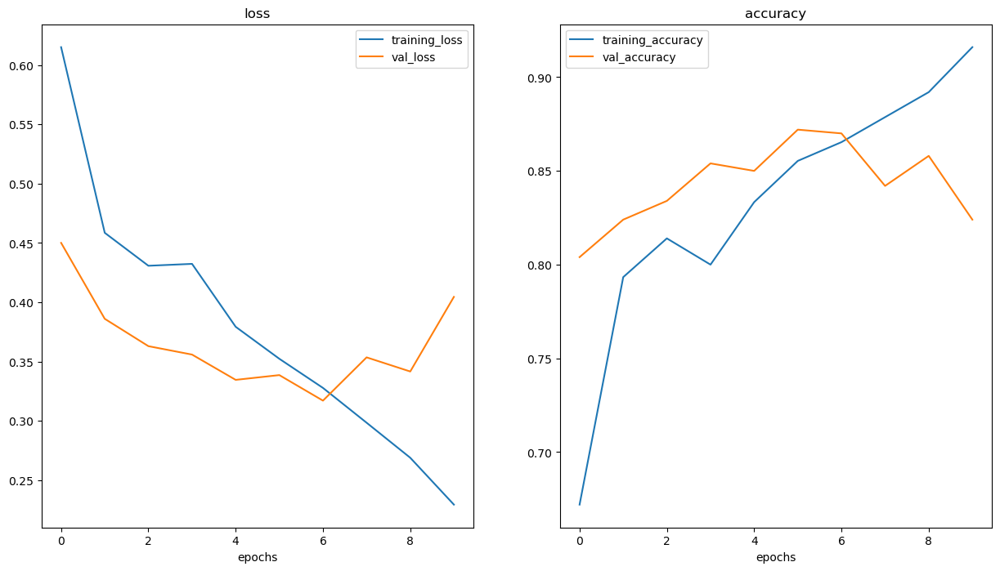

In [ ]:
plot_loss_curves(history_5)

### Finding data augmentation

* Altering data leading it to have more diversity and stuff

In [ ]:
# Create imageDataGenerator trainig instances with data augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen_augmented = ImageDataGenerator(rescale=1./255,
                                             rotation_range=0.6,
                                             shear_range=0.8,
                                             zoom_range=0.65,
                                             width_shift_range=0.5,
                                             height_shift_range=0.5,
                                             horizontal_flip=True)


# Create ImageDaagenerator without data augmentation
train_datagen = ImageDataGenerator(rescale=1./255)

# Creating ImageDataGenerator without data augmentation for the test dataset
test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                         batch_size=64,
                                                         target_size=(224,224),
                                                         seed=42,
                                                         class_mode="binary",
                                                         shuffle=False)

train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=64,
                                               target_size=(224,224),
                                               seed=42,
                                               class_mode="binary",
                                               shuffle=False)

test_data = test_datagen.flow_from_directory(test_dir,
                                            batch_size=64,
                                            target_size=(224,224),
                                            seed=42,
                                            class_mode="binary")

Found 1500 images belonging to 2 classes.
Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.


In [ ]:
# Get the sample data batches
images, labels = train_data.next()
augmented_images, augmented_labels = train_data_augmented.next() # lables arent augmented, only data

Random number :  13


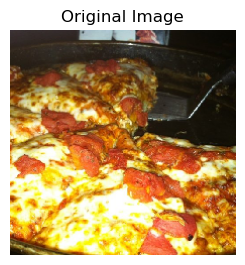

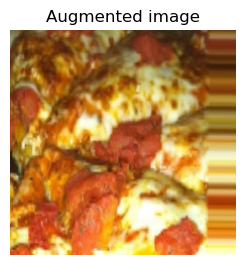

In [ ]:
# Show original image and augmented image
import random
tf.random.set_seed(42)
random_number = random.randint(0,32)
"""print("Random number : ",random_number)
print("Original image\n")
plt.imshow(images[random_number])
plt.axis(False)
plt.figure()
print("Augmented image\n")
plt.imshow(augmented_images[random_number])
plt.axis(False)"""
print("Random number : ",random_number)
ax=plt.subplot(1,2,1)
plt.imshow(images[random_number])
plt.axis(False)
plt.title("Original Image")
plt.show()
ax = plt.subplot(1,2,2)
plt.imshow(augmented_images[random_number])
plt.axis(False)
plt.title("Augmented image")
plt.show()


In [ ]:
train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                         batch_size=32,
                                                         target_size=(224,224),
                                                         seed=42,
                                                         class_mode="binary",
                                                         shuffle=False)

train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=32,
                                               target_size=(224,224),
                                               seed=42,
                                               class_mode="binary",
                                               shuffle=False)

test_data = test_datagen.flow_from_directory(test_dir,
                                            batch_size=64,
                                            target_size=(224,224),
                                            seed=42,
                                            class_mode="binary")
model_6 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])

model_6.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                   optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                   metrics=["accuracy"])
hisotry_6_augmented=model_6.fit(train_data_augmented,
                                epochs=10,
                                steps_per_epoch=len(train_data_augmented),
                                validation_data= test_data,
                                validation_steps=len(test_data))

Found 1500 images belonging to 2 classes.
Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/10


2023-06-07 22:37:58.292615: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.7011 - accuracy: 0.4900

2023-06-07 22:38:10.709516: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 14s 283ms/step - loss: 0.7011 - accuracy: 0.4900 - val_loss: 0.6916 - val_accuracy: 0.5600
Epoch 2/10
47/47 [==============================] - 14s 294ms/step - loss: 0.6934 - accuracy: 0.5020 - val_loss: 0.6871 - val_accuracy: 0.5260
Epoch 3/10
47/47 [==============================] - 14s 305ms/step - loss: 0.6902 - accuracy: 0.5393 - val_loss: 0.6777 - val_accuracy: 0.5380
Epoch 4/10
47/47 [==============================] - 14s 302ms/step - loss: 0.7250 - accuracy: 0.5360 - val_loss: 0.6901 - val_accuracy: 0.5400
Epoch 5/10
47/47 [==============================] - 14s 286ms/step - loss: 0.6937 - accuracy: 0.5387 - val_loss: 0.6856 - val_accuracy: 0.7460
Epoch 6/10
47/47 [==============================] - 14s 303ms/step - loss: 0.6928 - accuracy: 0.5200 - val_loss: 0.6861 - val_accuracy: 0.5380
Epoch 7/10
47/47 [==============================] - 13s 282ms/step - loss: 0.6973 - accuracy: 0.4360 - val_loss: 0.6849 - val_accuracy: 0.7400
Epoch 8/10

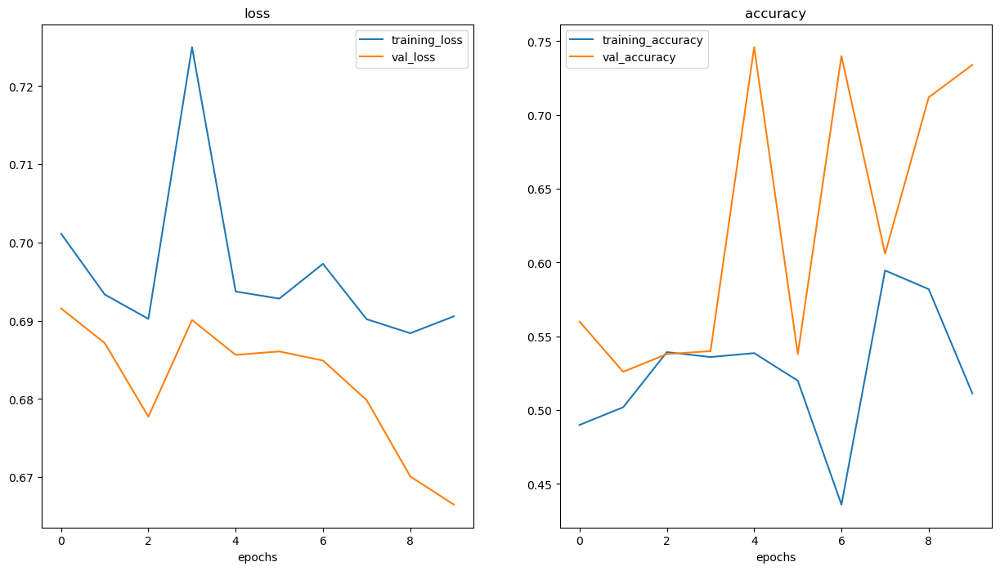

In [ ]:
# Check the model's training curves
plot_loss_curves(hisotry_6_augmented)

In [ ]:
# Allow shuffling of data
train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                                   target_size=(224,224),
                                                                   batch_size=32,
                                                                   seed=42,
                                                                   class_mode="binary",
                                                                   shuffle=True)
model_7 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])
model_7.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])
history_7_augmented = model_7.fit(train_data_augmented,
                                  epochs=10,
                                  steps_per_epoch=len(train_data_augmented),
                                  validation_data=test_data,
                                  validation_steps=len(test_data))

Found 1500 images belonging to 2 classes.
Epoch 1/10


2023-06-07 22:40:17.403614: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.6808 - accuracy: 0.5580

2023-06-07 22:40:29.834762: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 14s 284ms/step - loss: 0.6808 - accuracy: 0.5580 - val_loss: 0.6365 - val_accuracy: 0.6400
Epoch 2/10
47/47 [==============================] - 13s 280ms/step - loss: 0.6357 - accuracy: 0.6327 - val_loss: 0.5619 - val_accuracy: 0.7060
Epoch 3/10
47/47 [==============================] - 14s 288ms/step - loss: 0.6063 - accuracy: 0.6727 - val_loss: 0.5591 - val_accuracy: 0.6840
Epoch 4/10
47/47 [==============================] - 14s 288ms/step - loss: 0.5631 - accuracy: 0.7093 - val_loss: 0.3876 - val_accuracy: 0.8200
Epoch 5/10
47/47 [==============================] - 14s 290ms/step - loss: 0.5637 - accuracy: 0.7287 - val_loss: 0.3772 - val_accuracy: 0.8380
Epoch 6/10
47/47 [==============================] - 14s 290ms/step - loss: 0.5390 - accuracy: 0.7440 - val_loss: 0.4124 - val_accuracy: 0.8000
Epoch 7/10
47/47 [==============================] - 14s 293ms/step - loss: 0.5454 - accuracy: 0.7447 - val_loss: 0.3694 - val_accuracy: 0.8400
Epoch 8/10

### Improve the model

* Increase the number of layers
* Increase the number of filters in each convolutional layer
* Train for longer
* Find the ideal learning rate
* Get more data
* Use transfer learning

In [ ]:
train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                                   target_size=(224,224),
                                                                   batch_size=32,
                                                                   seed=42,
                                                                   class_mode="binary",
                                                                   shuffle=True)
test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(224,224),
                                             batch_size=32,
                                             seed=42,
                                             class_mode="binary",
                                             shuffle=True)
model_8 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=2,
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(filters=20,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])
model_8.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                metrics=["accuracy"])
history_8_augmented=model_8.fit(train_data_augmented,
                                epochs=10,
                                steps_per_epoch=len(train_data_augmented),
                                validation_data=test_data,
                                validation_steps=len(test_data))

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/10


2023-06-07 22:42:36.785453: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.6926 - accuracy: 0.5240

2023-06-07 22:42:50.955176: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 16s 312ms/step - loss: 0.6926 - accuracy: 0.5240 - val_loss: 0.6876 - val_accuracy: 0.5660
Epoch 2/10
47/47 [==============================] - 15s 326ms/step - loss: 0.6929 - accuracy: 0.4980 - val_loss: 0.6627 - val_accuracy: 0.5000
Epoch 3/10
47/47 [==============================] - 16s 336ms/step - loss: 0.6424 - accuracy: 0.6467 - val_loss: 0.5571 - val_accuracy: 0.7100
Epoch 4/10
47/47 [==============================] - 15s 327ms/step - loss: 0.6143 - accuracy: 0.6833 - val_loss: 0.5150 - val_accuracy: 0.7780
Epoch 5/10
47/47 [==============================] - 16s 334ms/step - loss: 0.5837 - accuracy: 0.7027 - val_loss: 0.4176 - val_accuracy: 0.8360
Epoch 6/10
47/47 [==============================] - 16s 338ms/step - loss: 0.5789 - accuracy: 0.7173 - val_loss: 0.5225 - val_accuracy: 0.7520
Epoch 7/10
47/47 [==============================] - 16s 337ms/step - loss: 0.5622 - accuracy: 0.7167 - val_loss: 0.5130 - val_accuracy: 0.7520
Epoch 8/10

In [ ]:
tf.random.set_seed(42)

train_datagen_augmented = ImageDataGenerator(rescale=1./255,
                                             rotation_range=0.8,
                                             zoom_range=0.9,
                                             width_shift_range=0.65,
                                             height_shift_range=0.5,
                                             horizontal_flip=True)
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_dir = "pizza_steak/train/"
test_dir = "pizza_steak/test/"

train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                                   target_size=(224,224),
                                                                   batch_size=64,
                                                                   seed=42,
                                                                   class_mode="binary",
                                                                   shuffle=True)
train_data = train_datagen.flow_from_directory(train_dir,
                                               target_size=(224,224),
                                               batch_size=64,
                                               seed=42,
                                               class_mode="binary",
                                               shuffle=True)
test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(224,224),
                                             batch_size=64,
                                             class_mode="binary",
                                             seed=42,
                                             shuffle=True)

model_9_augmented = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])

model_9_augmented.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                metrics=["accuracy"])

history_9_augmented = model_9_augmented.fit(train_data_augmented,
                                  epochs=10,
                                  steps_per_epoch=len(train_data_augmented),
                                  validation_data=test_data,
                                  validation_steps=len(test_data))

model_9 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=32,
                           kernel_size=2,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                            padding="valid"),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])

model_9.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                metrics=["accuracy"])

history_9 = model_9.fit(train_data,
                        epochs=10,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Found 1500 images belonging to 2 classes.
Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/10


2023-06-07 22:45:20.493302: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


24/24 [==============================] - ETA: 0s - loss: 0.6830 - accuracy: 0.5440

2023-06-07 22:45:38.168548: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


24/24 [==============================] - 20s 742ms/step - loss: 0.6830 - accuracy: 0.5440 - val_loss: 0.6840 - val_accuracy: 0.5200
Epoch 2/10
24/24 [==============================] - 17s 701ms/step - loss: 0.6496 - accuracy: 0.6260 - val_loss: 0.6018 - val_accuracy: 0.6880
Epoch 3/10
24/24 [==============================] - 19s 761ms/step - loss: 0.6350 - accuracy: 0.6500 - val_loss: 0.6011 - val_accuracy: 0.6700
Epoch 4/10
24/24 [==============================] - 18s 717ms/step - loss: 0.6331 - accuracy: 0.6553 - val_loss: 0.5714 - val_accuracy: 0.7440
Epoch 5/10
24/24 [==============================] - 18s 715ms/step - loss: 0.6305 - accuracy: 0.6540 - val_loss: 0.5709 - val_accuracy: 0.7220
Epoch 6/10
24/24 [==============================] - 18s 749ms/step - loss: 0.6065 - accuracy: 0.6853 - val_loss: 0.4897 - val_accuracy: 0.7740
Epoch 7/10
24/24 [==============================] - 18s 735ms/step - loss: 0.5857 - accuracy: 0.6927 - val_loss: 0.4546 - val_accuracy: 0.8140
Epoch 8/10

2023-06-07 22:48:21.884780: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


24/24 [==============================] - ETA: 0s - loss: 0.6472 - accuracy: 0.6293

2023-06-07 22:48:31.674134: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


24/24 [==============================] - 12s 455ms/step - loss: 0.6472 - accuracy: 0.6293 - val_loss: 0.5138 - val_accuracy: 0.7500
Epoch 2/10
24/24 [==============================] - 11s 436ms/step - loss: 0.5018 - accuracy: 0.7627 - val_loss: 0.4512 - val_accuracy: 0.8020
Epoch 3/10
24/24 [==============================] - 11s 443ms/step - loss: 0.4849 - accuracy: 0.7827 - val_loss: 0.4246 - val_accuracy: 0.7980
Epoch 4/10
24/24 [==============================] - 11s 444ms/step - loss: 0.4621 - accuracy: 0.7967 - val_loss: 0.3850 - val_accuracy: 0.8500
Epoch 5/10
24/24 [==============================] - 11s 437ms/step - loss: 0.4273 - accuracy: 0.8193 - val_loss: 0.3440 - val_accuracy: 0.8540
Epoch 6/10
24/24 [==============================] - 12s 477ms/step - loss: 0.4080 - accuracy: 0.8293 - val_loss: 0.3556 - val_accuracy: 0.8740
Epoch 7/10
24/24 [==============================] - 11s 454ms/step - loss: 0.3841 - accuracy: 0.8400 - val_loss: 0.3409 - val_accuracy: 0.8740
Epoch 8/10

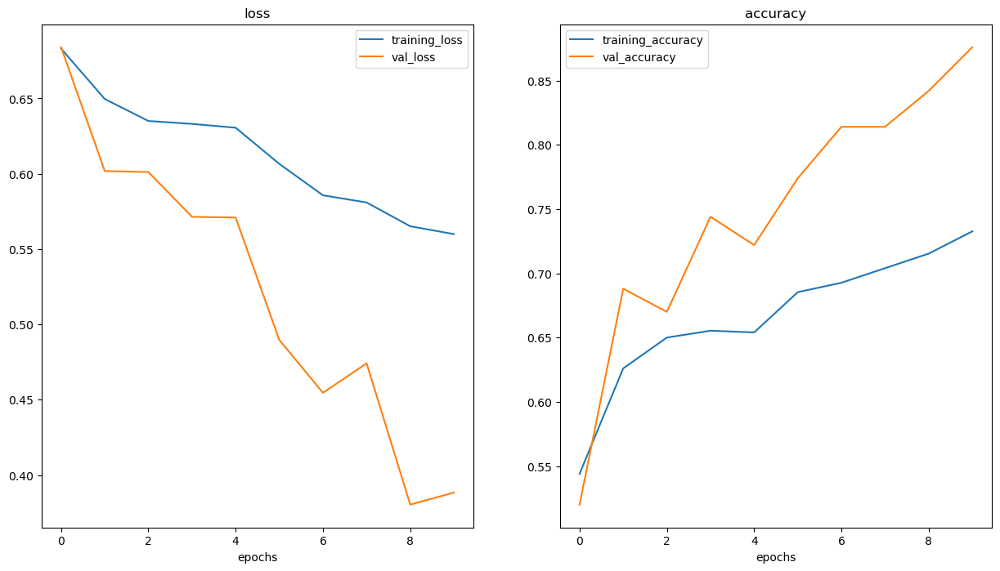

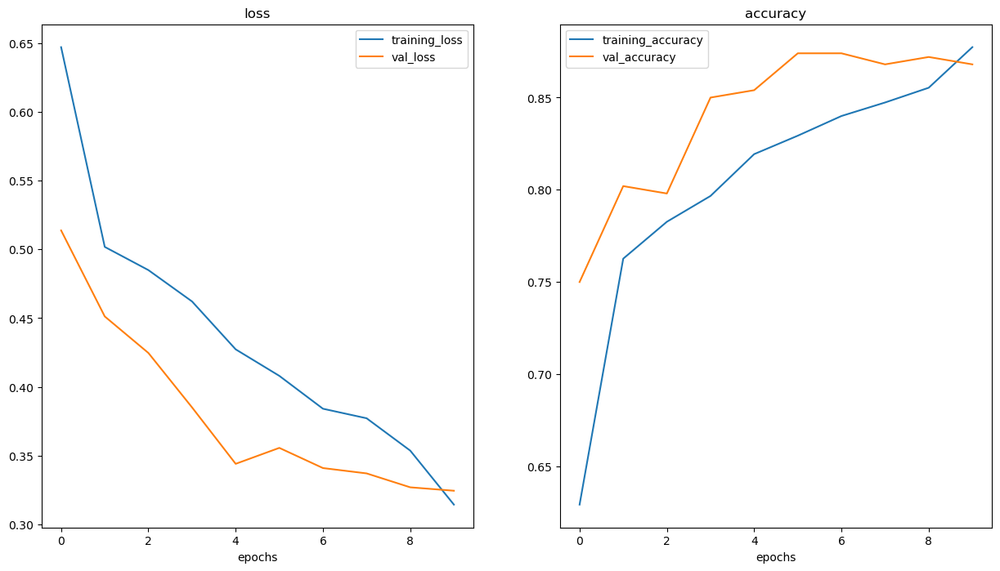

In [ ]:
plot_loss_curves(history_9_augmented)
plot_loss_curves(history_9)

In [ ]:
# practice the above model again
tf.random.set_seed(42)

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_dir = "pizza_steak/train/"
test_dir = "pizza_steak/test"

train_data = train_datagen.flow_from_directory(train_dir,
                                               target_size=(224,224),
                                               seed=42,
                                               batch_size=32,
                                               shuffle=True,
                                               class_mode="binary")
test_data = test_datagen.flow_from_directory(test_dir,
                                               target_size=(224,224),
                                               seed=42,
                                               batch_size=32,
                                               shuffle=True,
                                               class_mode="binary")

model_practice = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2,
                              padding="valid"),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])
model_practice.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                       optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                       metrics=['mae','accuracy'])
history_practive = model_practice.fit(train_data,
                                      epochs=10,
                                      steps_per_epoch=len(train_data),
                                      validation_data=test_data,
                                      validation_steps=len(test_data))


Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/10


2023-06-07 22:50:14.302855: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.6805 - mae: 0.4911 - accuracy: 0.5400

2023-06-07 22:50:21.609241: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 10s 172ms/step - loss: 0.6805 - mae: 0.4911 - accuracy: 0.5400 - val_loss: 0.6233 - val_mae: 0.4570 - val_accuracy: 0.6980
Epoch 2/10
47/47 [==============================] - 7s 140ms/step - loss: 0.5512 - mae: 0.3772 - accuracy: 0.7180 - val_loss: 0.4440 - val_mae: 0.2939 - val_accuracy: 0.8220
Epoch 3/10
47/47 [==============================] - 7s 152ms/step - loss: 0.4947 - mae: 0.3267 - accuracy: 0.7587 - val_loss: 0.4358 - val_mae: 0.2672 - val_accuracy: 0.8260
Epoch 4/10
47/47 [==============================] - 7s 144ms/step - loss: 0.4497 - mae: 0.2871 - accuracy: 0.8033 - val_loss: 0.3695 - val_mae: 0.2466 - val_accuracy: 0.8540
Epoch 5/10
47/47 [==============================] - 7s 151ms/step - loss: 0.4454 - mae: 0.2896 - accuracy: 0.8187 - val_loss: 0.3573 - val_mae: 0.2373 - val_accuracy: 0.8540
Epoch 6/10
47/47 [==============================] - 7s 146ms/step - loss: 0.4465 - mae: 0.2785 - accuracy: 0.8160 - val_loss: 0.3867 - val_m

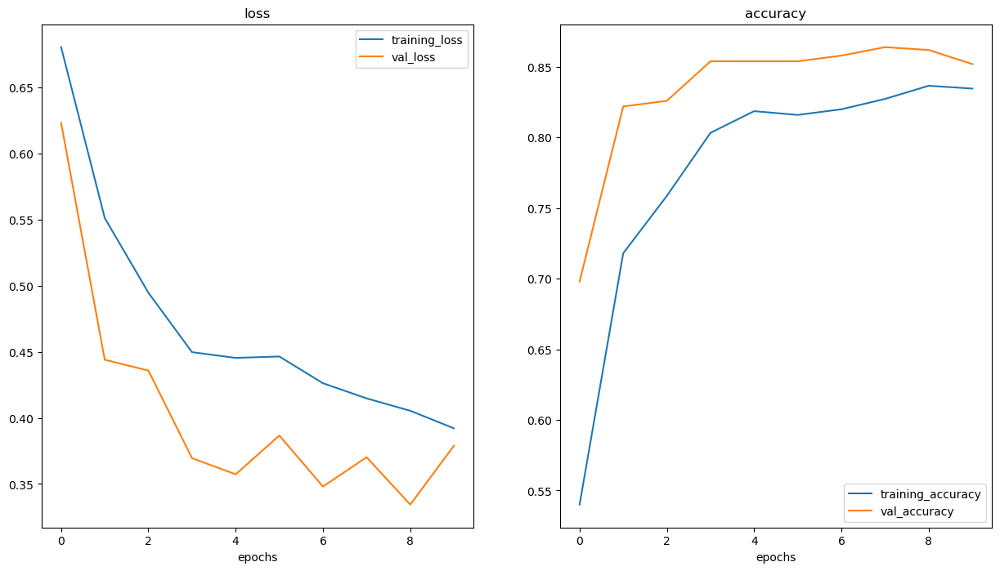

In [ ]:
plot_loss_curves(history_practive)

### Using custom data

In [ ]:
print(class_names)

['pizza' 'steak']


--2023-06-07 22:51:26--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 2606:50c0:8002::154, 2606:50c0:8001::154, 2606:50c0:8000::154, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|2606:50c0:8002::154|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1978213 (1.9M) [image/jpeg]
Saving to: ‘03-steak.jpeg.1’

03-steak.jpeg.1     100%[===================>]   1.89M  2.51MB/s    in 0.8s    

2023-06-07 22:51:28 (2.51 MB/s) - ‘03-steak.jpeg.1’ saved [1978213/1978213]



(-0.5, 3023.5, 4031.5, -0.5)

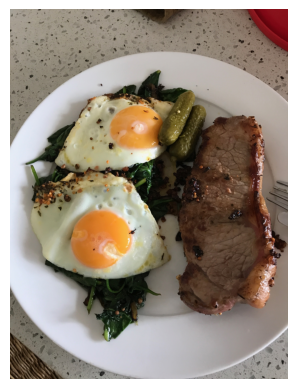

In [ ]:
import matplotlib.image as mpimg
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg
steak = mpimg.imread("03-steak.jpeg")
plt.imshow(steak)
plt.axis(False)

In [ ]:
steak.shape,type(steak)

((4032, 3024, 3), numpy.ndarray)

In [ ]:
steak_tensor = tf.cast(tf.constant(steak),dtype=tf.float32)
type(steak_tensor),steak_tensor.shape

(tensorflow.python.framework.ops.EagerTensor, TensorShape([4032, 3024, 3]))

In [ ]:
# model_practice.predict(tf.expand_dims(tf.reshape(steak_tensor,shape=(224,224)),axis=0))

### Need to resize our test image to match the shape the model has been trained upon

In [ ]:
def load_and_prep_image(filename,image_shape=224):
    #Read the image
    img = tf.io.read_file(filename)
    #Decode the read file into tensor
    img = tf.image.decode_image(img)
    #Resize image
    img = tf.image.resize(img,size=[image_shape,image_shape])
    # Rescale the image and get all values between 0 and 1
    img = img/255.
    return img

In [ ]:
steak = load_and_prep_image("03-steak.jpeg")
steak,len(steak)

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.6377451 , 0.6220588 , 0.57892156],
         [0.6504902 , 0.63186276, 0.5897059 ],
         [0.63186276, 0.60833335, 0.5612745 ],
         ...,
         [0.52156866, 0.05098039, 0.09019608],
         [0.49509802, 0.04215686, 0.07058824],
         [0.52843136, 0.07745098, 0.10490196]],
 
        [[0.6617647 , 0.6460784 , 0.6107843 ],
         [0.6387255 , 0.6230392 , 0.57598037],
         [0.65588236, 0.63235295, 0.5852941 ],
         ...,
         [0.5352941 , 0.06862745, 0.09215686],
         [0.529902  , 0.05931373, 0.09460784],
         [0.5142157 , 0.05539216, 0.08676471]],
 
        [[0.6519608 , 0.6362745 , 0.5892157 ],
         [0.6392157 , 0.6137255 , 0.56764704],
         [0.65637255, 0.6269608 , 0.5828431 ],
         ...,
         [0.53137255, 0.06470589, 0.08039216],
         [0.527451  , 0.06862745, 0.1       ],
         [0.52254903, 0.05196078, 0.0872549 ]],
 
        ...,
 
        [[0.49313724, 0.42745098

In [ ]:
pred = model_practice.predict(tf.expand_dims(steak,axis=0))
pred

2023-06-07 22:51:30.119644: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 640ms/step


array([[0.93508255]], dtype=float32)

looks like our custom image os being put through the model

In [ ]:
class_names

array(['pizza', 'steak'], dtype='<U5')

In [ ]:
# We can index the predicted class by rounding the prediction probabilty
pred_class = class_names[int(tf.round(pred))]
pred_class


'steak'

In [ ]:
def pred_and_plot(model,filename,class_names=class_names):
    img=load_and_prep_image(filename)
    pred = model.predict(tf.expand_dims(img,axis=0))
    pred_class = class_names[int(tf.round(pred))]
    plt.imshow(img)
    plt.title(pred_class)
    plt.axis(False)

1/1 [==============================] - 0s 14ms/step


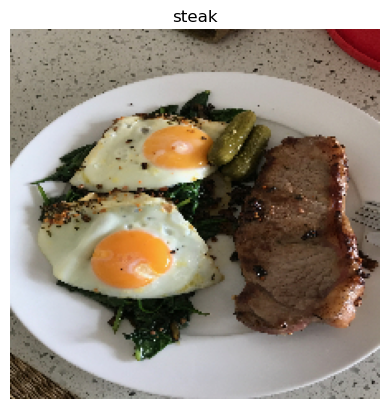

In [ ]:
pred_and_plot(model=model_practice,filename="03-steak.jpeg")

In [ ]:
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-pizza-dad.jpeg

--2023-06-07 22:51:31--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-pizza-dad.jpeg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 2606:50c0:8001::154, 2606:50c0:8000::154, 2606:50c0:8003::154, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|2606:50c0:8001::154|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2874848 (2.7M) [image/jpeg]
Saving to: ‘03-pizza-dad.jpeg.1’

03-pizza-dad.jpeg.1 100%[===================>]   2.74M  4.00MB/s    in 0.7s    

2023-06-07 22:51:32 (4.00 MB/s) - ‘03-pizza-dad.jpeg.1’ saved [2874848/2874848]



In [ ]:
model_7.predict(tf.expand_dims(load_and_prep_image("03-pizza-dad.jpeg"),axis=0))

1/1 [==============================] - 0s 72ms/step


2023-06-07 22:51:32.856292: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


array([[0.14561453]], dtype=float32)

1/1 [==============================] - 0s 11ms/step


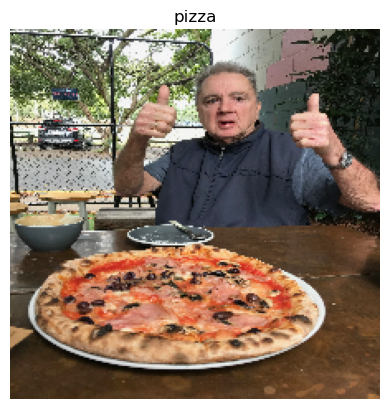

In [ ]:
pred_and_plot(model_7,"03-pizza-dad.jpeg")

Train a better model and avoid edge cases ---> 0.511 taken as steak wherein it is pizza

In [ ]:
tf.random.set_seed(42)
train_dir="pizza_steak/train/"
test_dir ="pizza_steak/test/"
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)
train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=32,
                                               target_size=(224,224),
                                               seed=42,
                                               class_mode="binary")
test_data = test_datagen.flow_from_directory(test_dir,
                                             batch_size=32,
                                             target_size=(224,224),
                                             seed=42,
                                             class_mode="binary")
model_10 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(2,2),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(1,1),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(1,1),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1,activation=tf.keras.activations.sigmoid)
])
model_10.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(learning_rate=0.00125),
                 metrics=["accuracy"])
history_10 = model_10.fit(train_data,
                          epochs=12,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Found 1500 images belonging to 2 classes.
Found 500 images belonging to 2 classes.
Epoch 1/12


2023-06-07 22:51:34.191291: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - ETA: 0s - loss: 0.6717 - accuracy: 0.5653

2023-06-07 22:51:41.757659: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


47/47 [==============================] - 10s 166ms/step - loss: 0.6717 - accuracy: 0.5653 - val_loss: 0.5387 - val_accuracy: 0.7740
Epoch 2/12
47/47 [==============================] - 7s 142ms/step - loss: 0.5054 - accuracy: 0.7680 - val_loss: 0.4041 - val_accuracy: 0.8400
Epoch 3/12
47/47 [==============================] - 7s 146ms/step - loss: 0.4627 - accuracy: 0.7880 - val_loss: 0.4151 - val_accuracy: 0.8180
Epoch 4/12
47/47 [==============================] - 7s 144ms/step - loss: 0.4318 - accuracy: 0.8200 - val_loss: 0.3668 - val_accuracy: 0.8460
Epoch 5/12
47/47 [==============================] - 7s 146ms/step - loss: 0.4340 - accuracy: 0.8140 - val_loss: 0.4192 - val_accuracy: 0.8160
Epoch 6/12
47/47 [==============================] - 7s 142ms/step - loss: 0.4233 - accuracy: 0.8293 - val_loss: 0.3522 - val_accuracy: 0.8620
Epoch 7/12
47/47 [==============================] - 7s 141ms/step - loss: 0.3880 - accuracy: 0.8293 - val_loss: 0.3518 - val_accuracy: 0.8640
Epoch 8/12
47/47

2023-06-07 22:52:58.753230: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 695ms/step


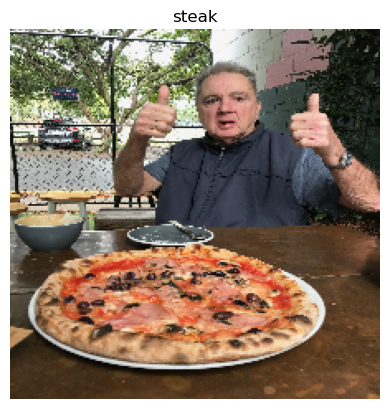

In [ ]:
pred_and_plot(model_10,"03-pizza-dad.jpeg")

1/1 [==============================] - 0s 50ms/step


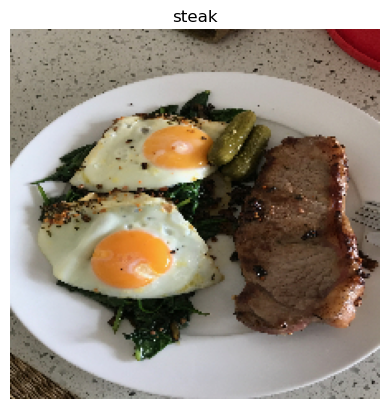

In [ ]:
pred_and_plot(model_10,"03-steak.jpeg")

# Multi-class Image Classification Problem
* (10 classes)
1. Preprocess the data
2. Create a model
3. Fit the model
4. Evaluate the model
5. Adjust different hyper-parameters
6. Repeat

In [ ]:
import zipfile
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
#unzip the data
zip_ref=zipfile.ZipFile("10_food_classes_all_data.zip","r")
zip_ref.extractall()
zip_ref.close()

--2023-06-07 22:52:59--  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 2404:6800:4007:815::2010, 2404:6800:4007:808::2010, 2404:6800:4007:804::2010, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|2404:6800:4007:815::2010|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 519183241 (495M) [application/zip]
Saving to: ‘10_food_classes_all_data.zip.3’

10_food_classes_all  76%[==============>     ] 379.90M  32.0KB/s    in 3m 57s  

2023-06-07 22:57:04 (1.61 MB/s) - Read error at byte 398358362/519183241 (Connection reset by peer). Retrying.

--2023-06-07 22:57:05--  (try: 2)  https://storage.googleapis.com/ztm_tf_course/food_vision/10_food_classes_all_data.zip
Connecting to storage.googleapis.com (storage.googleapis.com)|2404:6800:4007:815::2010|:443... connected.
HTTP request sent, awaiting response... 206 Partial Content
Length: 519183241 (495M),

In [ ]:
import os

for dirpath,dirnames,filenames in os.walk("10_food_classes_all_data"):
    print("There are ",len(dirnames)," directories and ",len(filenames)," images in ",dirpath,".")

There are  2  directories and  1  images in  10_food_classes_all_data .
There are  10  directories and  0  images in  10_food_classes_all_data/test .
There are  0  directories and  250  images in  10_food_classes_all_data/test/ice_cream .
There are  0  directories and  250  images in  10_food_classes_all_data/test/chicken_curry .
There are  0  directories and  250  images in  10_food_classes_all_data/test/steak .
There are  0  directories and  250  images in  10_food_classes_all_data/test/sushi .
There are  0  directories and  250  images in  10_food_classes_all_data/test/chicken_wings .
There are  0  directories and  250  images in  10_food_classes_all_data/test/grilled_salmon .
There are  0  directories and  250  images in  10_food_classes_all_data/test/hamburger .
There are  0  directories and  250  images in  10_food_classes_all_data/test/pizza .
There are  0  directories and  250  images in  10_food_classes_all_data/test/ramen .
There are  0  directories and  250  images in  10_fo

In [ ]:
# Setup the path
train_dir = "10_food_classes_all_data/train/"
test_dir = "10_food_classes_all_data/test/"

In [ ]:
# Lets get the class names
import pathlib
import numpy as np
data_dir = pathlib.Path(train_dir)
class_names=np.array(sorted([item.name for item in data_dir.glob("*")]))
print(class_names)

['chicken_curry' 'chicken_wings' 'fried_rice' 'grilled_salmon' 'hamburger'
 'ice_cream' 'pizza' 'ramen' 'steak' 'sushi']


['3870836.jpg']


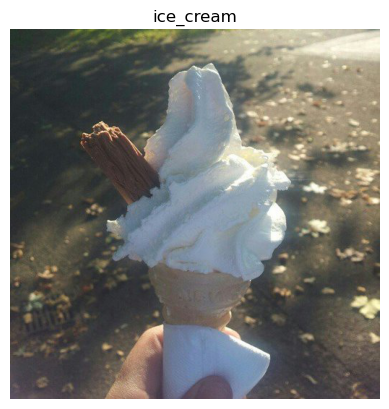

Image shape (512, 512, 3)


In [ ]:
# Visualise
import random
img = view_random_image(target_dir=train_dir,
                        target_class=random.choice(class_names))

In [ ]:
# preprocess the data
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#Rescale
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

#Load data
train_data = train_datagen.flow_from_directory(train_dir,
                                               batch_size=32,
                                               target_size=(224,224),
                                               seed=42,
                                               class_mode="categorical")
test_data = test_datagen.flow_from_directory(test_dir,
                                             batch_size=32,
                                             target_size=(224,224),
                                             seed=42,
                                             class_mode="categorical")

Found 7500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.


In [ ]:
# Create a model(start with a baseline)

model_11 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10,activation=tf.keras.activations.softmax)
])

model_11.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                 metrics=['accuracy'])

history_11 = model_11.fit(train_data,
                          epochs=10,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/10


2023-06-07 22:57:35.167811: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.1212 - accuracy: 0.2352

2023-06-07 22:58:00.570001: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 31s 130ms/step - loss: 2.1212 - accuracy: 0.2352 - val_loss: 1.9668 - val_accuracy: 0.2740
Epoch 2/10
235/235 [==============================] - 30s 127ms/step - loss: 1.8535 - accuracy: 0.3545 - val_loss: 1.8550 - val_accuracy: 0.3616
Epoch 3/10
235/235 [==============================] - 31s 131ms/step - loss: 1.5997 - accuracy: 0.4644 - val_loss: 1.8356 - val_accuracy: 0.3624
Epoch 4/10
235/235 [==============================] - 32s 134ms/step - loss: 1.2085 - accuracy: 0.6016 - val_loss: 2.1463 - val_accuracy: 0.3292
Epoch 5/10
235/235 [==============================] - 34s 145ms/step - loss: 0.6939 - accuracy: 0.7827 - val_loss: 2.4303 - val_accuracy: 0.3128
Epoch 6/10
235/235 [==============================] - 38s 162ms/step - loss: 0.2628 - accuracy: 0.9231 - val_loss: 3.4090 - val_accuracy: 0.3036
Epoch 7/10
235/235 [==============================] - 37s 158ms/step - loss: 0.0824 - accuracy: 0.9808 - val_loss: 4.2906 - val_accuracy: 0.2

In [ ]:
# Evaluate the model
model_11.evaluate(test_data)

79/79 [==============================] - 7s 86ms/step - loss: 5.5964 - accuracy: 0.2884


[5.596411228179932, 0.28839999437332153]

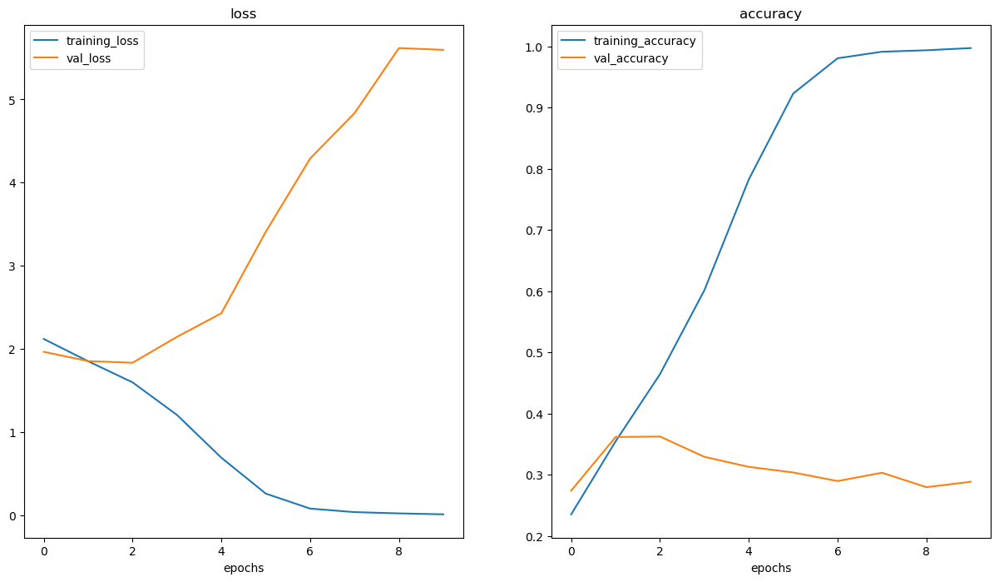

In [ ]:
plot_loss_curves(history_11)

From the above loss curves, we can see that the model is overfitting, i.e., great results on training data and poor results on test dataset

### Adjust the model hyper-parameters to beat the basline(overfitting)

In [ ]:
model_12 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=(3,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10,activation=tf.keras.activations.softmax)
])

model_12.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                 metrics=['accuracy'])

history_12 = model_12.fit(train_data,
                          epochs=10,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/10


2023-06-07 23:03:18.189764: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.2276 - accuracy: 0.2189

2023-06-07 23:03:40.193257: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 30s 122ms/step - loss: 2.2276 - accuracy: 0.2189 - val_loss: 2.0466 - val_accuracy: 0.2784
Epoch 2/10
235/235 [==============================] - 27s 117ms/step - loss: 1.8905 - accuracy: 0.3552 - val_loss: 1.9691 - val_accuracy: 0.3108
Epoch 3/10
235/235 [==============================] - 28s 117ms/step - loss: 1.6567 - accuracy: 0.4449 - val_loss: 1.9087 - val_accuracy: 0.3280
Epoch 4/10
235/235 [==============================] - 27s 115ms/step - loss: 1.3007 - accuracy: 0.5775 - val_loss: 2.0634 - val_accuracy: 0.3264
Epoch 5/10
235/235 [==============================] - 28s 119ms/step - loss: 0.9047 - accuracy: 0.7123 - val_loss: 2.3327 - val_accuracy: 0.3148
Epoch 6/10
235/235 [==============================] - 28s 119ms/step - loss: 0.5376 - accuracy: 0.8443 - val_loss: 2.6080 - val_accuracy: 0.3064
Epoch 7/10
235/235 [==============================] - 28s 119ms/step - loss: 0.2806 - accuracy: 0.9333 - val_loss: 3.2477 - val_accuracy: 0.2

In [ ]:
model_11.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_61 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 conv2d_62 (Conv2D)          (None, 220, 220, 10)      910       
                                                                 
 max_pooling2d_34 (MaxPoolin  (None, 110, 110, 10)     0         
 g2D)                                                            
                                                                 
 conv2d_63 (Conv2D)          (None, 108, 108, 10)      910       
                                                                 
 conv2d_64 (Conv2D)          (None, 106, 106, 10)      910       
                                                                 
 max_pooling2d_35 (MaxPoolin  (None, 53, 53, 10)       0         
 g2D)                                                

**Prevent overfitting:**
* Get more data
* Simplify the model - reduce the layers and reduce the complexity of the layers
* Use data augmentation
* Use transfer learning

In [ ]:
# Reduce the number of layers - 2 Conv2D layers
model_12 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           input_shape=(224,224,3),
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(pool_size=2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10,activation=tf.keras.activations.softmax)
])
model_12.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(),
                 metrics=['accuracy'])
history_12 = model_12.fit(train_data,
                          epochs=5,
                          steps_per_epoch=len(train_data),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/5


2023-06-07 23:07:56.337429: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.1067 - accuracy: 0.2379

2023-06-07 23:08:16.733867: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 27s 114ms/step - loss: 2.1067 - accuracy: 0.2379 - val_loss: 1.9949 - val_accuracy: 0.2912
Epoch 2/5
235/235 [==============================] - 27s 114ms/step - loss: 1.7858 - accuracy: 0.3905 - val_loss: 1.8735 - val_accuracy: 0.3452
Epoch 3/5
235/235 [==============================] - 28s 120ms/step - loss: 1.4208 - accuracy: 0.5348 - val_loss: 1.9630 - val_accuracy: 0.3188
Epoch 4/5
235/235 [==============================] - 27s 114ms/step - loss: 0.9905 - accuracy: 0.6943 - val_loss: 2.0584 - val_accuracy: 0.3388
Epoch 5/5
235/235 [==============================] - 26s 111ms/step - loss: 0.5818 - accuracy: 0.8364 - val_loss: 2.5231 - val_accuracy: 0.3232


In [ ]:
model_12.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_67 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 max_pooling2d_38 (MaxPoolin  (None, 111, 111, 10)     0         
 g2D)                                                            
                                                                 
 conv2d_68 (Conv2D)          (None, 109, 109, 10)      910       
                                                                 
 max_pooling2d_39 (MaxPoolin  (None, 54, 54, 10)       0         
 g2D)                                                            
                                                                 
 flatten_14 (Flatten)        (None, 29160)             0         
                                                                 
 dense_19 (Dense)            (None, 10)              

(None, None)

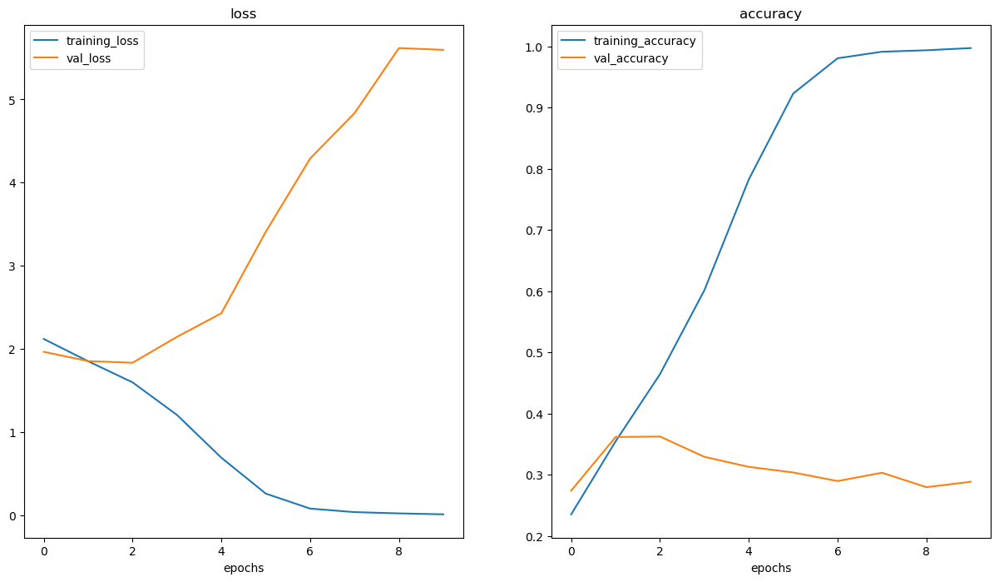

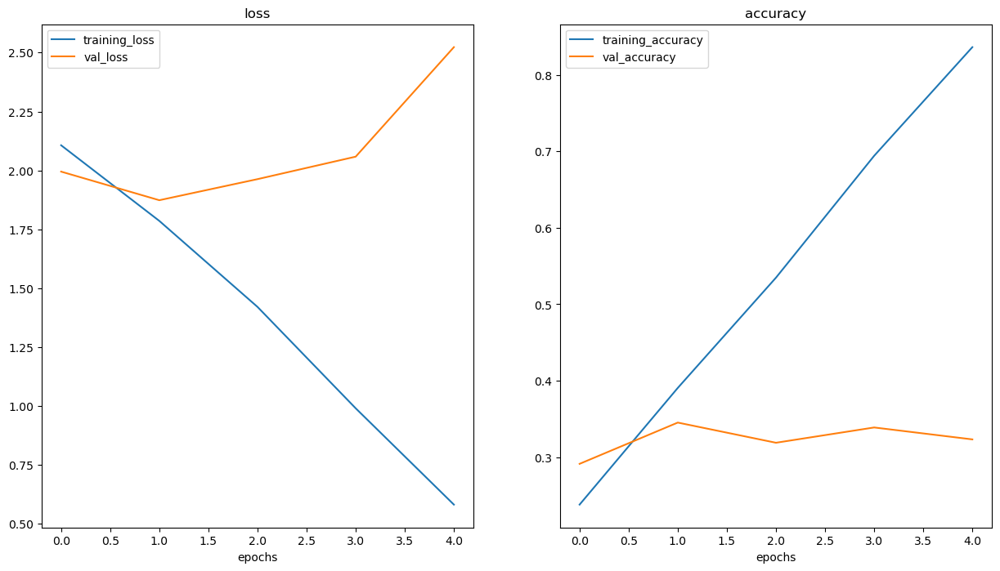

In [ ]:
plot_loss_curves(history_11),plot_loss_curves(history_12)

* ### Try using Data augmentation

In [ ]:
tf.random.set_seed(42)

train_dir="10_food_classes_all_data/train/"
test_dir="10_food_classes_all_data/test/"

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)
train_datagen_augmented = ImageDataGenerator(rescale=1./255,
                                             shear_range=0.2,
                                             width_shift_range=0.3,
                                             height_shift_range=0.2,
                                             vertical_flip=True,
                                             horizontal_flip=True,
                                             rotation_range=0.12)

train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                               target_size=(224,224),
                                                               batch_size=32,
                                                               class_mode="categorical",
                                                               shuffle=True)
test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(224,224),
                                             batch_size=32,
                                             class_mode="categorical",
                                             shuffle=True)

model_13 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10,activation=tf.keras.activations.softmax)
])
model_13.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(learning_rate=0.0012),
                 metrics=['accuracy'])
history_13 = model_13.fit(train_data_augmented,
                          epochs=5,
                          steps_per_epoch=len(train_data_augmented),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Found 7500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.
Epoch 1/5


2023-06-07 23:10:13.906709: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.2474 - accuracy: 0.1748

2023-06-07 23:11:16.965711: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 69s 293ms/step - loss: 2.2474 - accuracy: 0.1748 - val_loss: 2.0454 - val_accuracy: 0.2744
Epoch 2/5
 31/235 [==>...........................] - ETA: 54s - loss: 2.1272 - accuracy: 0.2530

: 

: 

In [ ]:
model_13.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_69 (Conv2D)          (None, 222, 222, 10)      280       
                                                                 
 max_pooling2d_40 (MaxPoolin  (None, 111, 111, 10)     0         
 g2D)                                                            
                                                                 
 conv2d_70 (Conv2D)          (None, 109, 109, 10)      910       
                                                                 
 max_pooling2d_41 (MaxPoolin  (None, 54, 54, 10)       0         
 g2D)                                                            
                                                                 
 flatten_15 (Flatten)        (None, 29160)             0         
                                                                 
 dense_20 (Dense)            (None, 10)              

Time per epoch is taking longer beccause the data is being augmeted on the fly and the original data is not being altered at the path

In [ ]:
model_13_1 = tf.keras.models.clone_model(model_12)
model_13_1.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                  optimizer=tf.keras.optimizers.Adam(learning_rate=0.0012),
                  metrics=['accuracy'])
history_13_1 = model_13_1.fit(train_data_augmented,
                          epochs=5,
                          steps_per_epoch=len(train_data_augmented),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Epoch 1/5


2023-04-21 07:38:08.182986: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.2404 - accuracy: 0.1711

2023-04-21 07:39:07.606440: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 65s 276ms/step - loss: 2.2404 - accuracy: 0.1711 - val_loss: 2.0862 - val_accuracy: 0.2344
Epoch 2/5
235/235 [==============================] - 72s 308ms/step - loss: 2.1223 - accuracy: 0.2368 - val_loss: 1.9651 - val_accuracy: 0.3064
Epoch 3/5
235/235 [==============================] - 68s 290ms/step - loss: 2.0575 - accuracy: 0.2737 - val_loss: 1.9193 - val_accuracy: 0.3364
Epoch 4/5
235/235 [==============================] - 64s 272ms/step - loss: 2.0262 - accuracy: 0.2861 - val_loss: 1.9321 - val_accuracy: 0.3272
Epoch 5/5
235/235 [==============================] - 63s 269ms/step - loss: 2.0035 - accuracy: 0.3024 - val_loss: 1.8389 - val_accuracy: 0.3656


In [ ]:
model_13.evaluate(test_data)

79/79 [==============================] - 5s 67ms/step - loss: 1.7929 - accuracy: 0.3852


[1.7929308414459229, 0.38519999384880066]

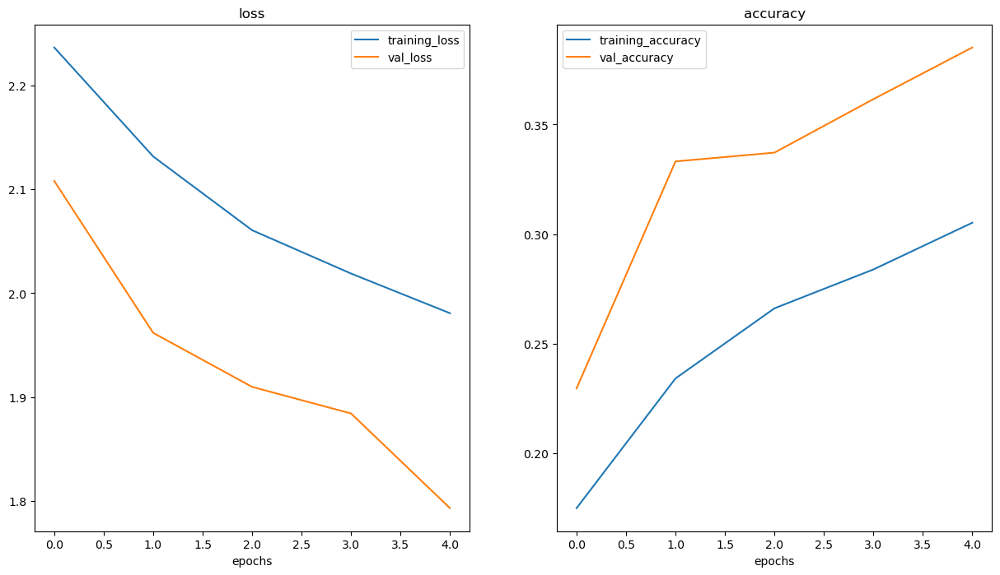

In [ ]:
plot_loss_curves(history_13)

### Make predictions

In [ ]:
class_names

array(['chicken_curry', 'chicken_wings', 'fried_rice', 'grilled_salmon',
       'hamburger', 'ice_cream', 'pizza', 'ramen', 'steak', 'sushi'],
      dtype='<U14')

In [ ]:
#!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-sushi.jpeg
#!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-pizza-dad.jpeg
#!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-hamburger.jpeg
#!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/images/03-steak.jpeg

In [ ]:
# Make a prediction
pred_and_plot(model_13,"03-pizza-dad.jpeg",class_names)
pred_and_plot(model_13,"03-hamburger.jpeg",class_names)
pred_and_plot(model_13,"03-steak.jpeg",class_names)
pred_and_plot(model_13,"03-sushi.jpeg",class_names)

1/1 [==============================] - 0s 78ms/step


2023-04-21 07:43:47.119662: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


TypeError: only size-1 arrays can be converted to Python scalars

In [ ]:
pred = model_13.predict(tf.expand_dims(load_and_prep_image("03-pizza-dad.jpeg"),axis=0))
pred

1/1 [==============================] - 0s 12ms/step


array([[0.03124154, 0.06481832, 0.07027296, 0.05267696, 0.07044587,
        0.06023644, 0.047419  , 0.2835268 , 0.06388137, 0.25548077]],
      dtype=float32)

In [ ]:
def pred_and_plot(model,filename,class_names=class_names):
    img=load_and_prep_image(filename)
    pred = model.predict(tf.expand_dims(img,axis=0))

    if(len(pred[0])>1):
        pred_class=class_names[tf.argmax(pred[0])]
    else:
        pred_class = class_names[int(tf.round(pred[0]))]
    plt.imshow(img)
    plt.title(pred_class)
    plt.axis(False)
    plt.show()

1/1 [==============================] - 0s 44ms/step


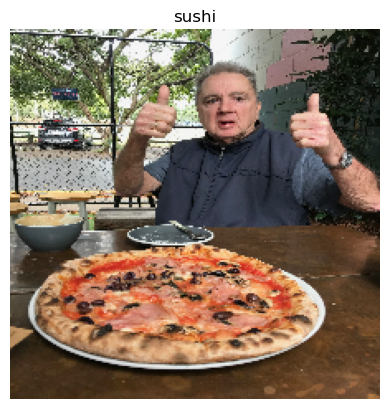

2023-04-21 07:53:59.710341: W tensorflow/core/framework/op_kernel.cc:1745] OP_REQUIRES failed at whole_file_read_ops.cc:116 : NOT_FOUND: 03-hamburger.jpeg; No such file or directory


NotFoundError: 03-hamburger.jpeg; No such file or directory [Op:ReadFile]

In [ ]:
# Make a prediction
pred_and_plot(model_13,"03-pizza-dad.jpeg",class_names)
pred_and_plot(model_13,"03-hamburger.jpeg",class_names)
pred_and_plot(model_13,"03-steak.jpeg",class_names)
pred_and_plot(model_13,"03-sushi.jpeg",class_names)

#### Repeat until imporved:
1. restruct the model's architecture - increase layers nad hidden units
2. Adjust learning rate
3. hyper-parameters/data augmentation
4. training for longer
5. Transfer learning

In [ ]:
tf.random.set_seed(42)

train_dir="10_food_classes_all_data/train/"
test_dir="10_food_classes_all_data/test/"

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)
train_datagen_augmented = ImageDataGenerator(rescale=1./255,
                                             shear_range=0.2,
                                             width_shift_range=0.3,
                                             height_shift_range=0.2,
                                             vertical_flip=True,
                                             horizontal_flip=True,
                                             rotation_range=0.12)

train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                               target_size=(224,224),
                                                               batch_size=32,
                                                               class_mode="categorical",
                                                               shuffle=True)
test_data = test_datagen.flow_from_directory(test_dir,
                                             target_size=(224,224),
                                             batch_size=32,
                                             class_mode="categorical",
                                             shuffle=True)

model_14 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=1,
                           activation=tf.keras.activations.relu,
                           input_shape=(224,224,3)),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=1,
                           activation=tf.keras.activations.relu),
    tf.keras.layers.MaxPool2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(10,activation=tf.keras.activations.softmax)
])
model_14.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(learning_rate=0.0012),
                 metrics=['accuracy'])
history_14 = model_14.fit(train_data_augmented,
                          epochs=5,
                          steps_per_epoch=len(train_data_augmented),
                          validation_data=test_data,
                          validation_steps=len(test_data))

Found 7500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.
Epoch 1/5


2023-04-21 07:58:32.841493: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.2803 - accuracy: 0.1940

2023-04-21 07:59:29.921466: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 64s 268ms/step - loss: 2.2803 - accuracy: 0.1940 - val_loss: 2.0843 - val_accuracy: 0.2384
Epoch 2/5
235/235 [==============================] - 63s 268ms/step - loss: 2.1206 - accuracy: 0.2452 - val_loss: 2.0048 - val_accuracy: 0.2868
Epoch 3/5
235/235 [==============================] - 63s 268ms/step - loss: 2.0976 - accuracy: 0.2555 - val_loss: 2.0140 - val_accuracy: 0.2960
Epoch 4/5
235/235 [==============================] - 63s 267ms/step - loss: 2.0770 - accuracy: 0.2657 - val_loss: 1.9670 - val_accuracy: 0.2992
Epoch 5/5
235/235 [==============================] - 67s 283ms/step - loss: 2.0634 - accuracy: 0.2777 - val_loss: 1.9389 - val_accuracy: 0.3108


# EXERCISE

In [ ]:
# 1. Find an ideal learning rate for a simple convolutional neural network model on the 10 class dataset.

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

tf.random.set_seed(42)

train_dir = "10_food_classes_all_data/train/"
test_dir = "10_food_classes_all_data/test/"

train_datagen_augmented = ImageDataGenerator(rescale=1./255,
                                             rotation_range=0.25,
                                             width_shift_range=0.25,
                                             height_shift_range=0.25,
                                             horizontal_flip=True,
                                             vertical_flip=True)
test_datagen = ImageDataGenerator(rescale=1./255)

train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                                                   seed=42,
                                                                   batch_size=32,
                                                                   target_size=(224,224),
                                                                   class_mode="categorical")
test_data = test_datagen.flow_from_directory(test_dir,
                                             seed=42,
                                             batch_size=32,
                                             target_size=(224,224),
                                             class_mode="categorical")

from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy, CategoricalCrossentropy

model_exercise = tf.keras.models.Sequential([
    Conv2D(filters=10,
           kernel_size=3,
           input_shape=(224,224,3),
           activation=relu),
    MaxPool2D(pool_size=2),
    Conv2D(filters=10,
           kernel_size=3,
           input_shape=(224,224,3),
           activation=relu),
    MaxPool2D(pool_size=2),
    Flatten(),
    Dense(10,activation=softmax)
])

model_exercise.compile(loss=CategoricalCrossentropy(),
                       optimizer=Adam(),
                       metrics=["accuracy"])

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch:1e-3*10**(epoch/20))

history_exercise = model_exercise.fit(train_data_augmented,
                                      epochs=20,
                                      steps_per_epoch=len(train_data),
                                      validation_data=test_data,
                                      validation_steps=len(test_data),
                                      callbacks=[lr_scheduler])

Found 7500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.
Epoch 1/20


2023-04-21 08:05:56.451131: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.2165 - accuracy: 0.1869

2023-04-21 08:06:54.259255: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 64s 268ms/step - loss: 2.2165 - accuracy: 0.1869 - val_loss: 2.0395 - val_accuracy: 0.2800 - lr: 0.0010
Epoch 2/20
235/235 [==============================] - 62s 265ms/step - loss: 2.0875 - accuracy: 0.2631 - val_loss: 1.9306 - val_accuracy: 0.3296 - lr: 0.0011
Epoch 3/20
235/235 [==============================] - 62s 265ms/step - loss: 2.0453 - accuracy: 0.2803 - val_loss: 1.8911 - val_accuracy: 0.3536 - lr: 0.0013
Epoch 4/20
235/235 [==============================] - 62s 262ms/step - loss: 2.0132 - accuracy: 0.3025 - val_loss: 1.8227 - val_accuracy: 0.3736 - lr: 0.0014
Epoch 5/20
235/235 [==============================] - 62s 265ms/step - loss: 1.9968 - accuracy: 0.3059 - val_loss: 1.8316 - val_accuracy: 0.3616 - lr: 0.0016
Epoch 6/20
235/235 [==============================] - 63s 267ms/step - loss: 1.9858 - accuracy: 0.3113 - val_loss: 1.8091 - val_accuracy: 0.3852 - lr: 0.0018
Epoch 7/20
235/235 [==============================] - 63s 267ms

In [ ]:
lsr = 1e-3*(10**(tf.range(20)/20))
lsr

<tf.Tensor: shape=(20,), dtype=float64, numpy=
array([0.001     , 0.00112202, 0.00125893, 0.00141254, 0.00158489,
       0.00177828, 0.00199526, 0.00223872, 0.00251189, 0.00281838,
       0.00316228, 0.00354813, 0.00398107, 0.00446684, 0.00501187,
       0.00562341, 0.00630957, 0.00707946, 0.00794328, 0.00891251])>

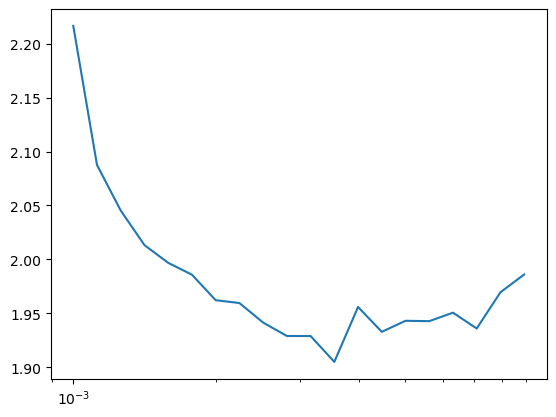

In [ ]:
import matplotlib.pyplot as plt
plt.semilogx(lsr,history_exercise.history["loss"])

In [ ]:
history_exercise.history

{'loss': [2.2165379524230957,
  2.0874972343444824,
  2.045259714126587,
  2.013174057006836,
  1.9967516660690308,
  1.9857503175735474,
  1.9621069431304932,
  1.9594718217849731,
  1.941353678703308,
  1.9288946390151978,
  1.928858757019043,
  1.9048817157745361,
  1.9558101892471313,
  1.9327548742294312,
  1.9430043697357178,
  1.9426506757736206,
  1.9505181312561035,
  1.9358456134796143,
  1.9694608449935913,
  1.9859504699707031],
 'accuracy': [0.18693333864212036,
  0.26306667923927307,
  0.280266672372818,
  0.3025333285331726,
  0.30586665868759155,
  0.3113333284854889,
  0.3163999915122986,
  0.3194666802883148,
  0.33133333921432495,
  0.3362666666507721,
  0.33346667885780334,
  0.3467999994754791,
  0.3233333230018616,
  0.33933332562446594,
  0.329066663980484,
  0.32946667075157166,
  0.3237333297729492,
  0.3306666612625122,
  0.31520000100135803,
  0.31413334608078003],
 'val_loss': [2.039503574371338,
  1.9306257963180542,
  1.8911038637161255,
  1.82274818420410

In [ ]:
ideal_lr = lsr[tf.argmax(history_exercise.history["val_loss"]).numpy()]
ideal_lr.numpy()

0.001

In [ ]:
model_exercise_2 = tf.keras.models.clone_model(model_exercise)
model_exercise_2.compile(loss=CategoricalCrossentropy(),
                         optimizer=Adam(learning_rate=ideal_lr.numpy()),
                         metrics=['accuracy'])
model_exercise_2.fit(train_data_augmented,
                     epochs=10,
                     steps_per_epoch=len(train_data),
                     validation_data=test_data,
                     validation_steps=len(test_data))

Epoch 1/10


2023-04-21 08:27:04.450216: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.2353 - accuracy: 0.1809

2023-04-21 08:28:03.491155: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 65s 274ms/step - loss: 2.2353 - accuracy: 0.1809 - val_loss: 2.0973 - val_accuracy: 0.2364
Epoch 2/10
235/235 [==============================] - 64s 272ms/step - loss: 2.1375 - accuracy: 0.2252 - val_loss: 1.9924 - val_accuracy: 0.2892
Epoch 3/10
235/235 [==============================] - 64s 271ms/step - loss: 2.0991 - accuracy: 0.2464 - val_loss: 1.9701 - val_accuracy: 0.3044
Epoch 4/10
235/235 [==============================] - 69s 294ms/step - loss: 2.0580 - accuracy: 0.2784 - val_loss: 1.9155 - val_accuracy: 0.3104
Epoch 5/10
235/235 [==============================] - 68s 287ms/step - loss: 2.0558 - accuracy: 0.2717 - val_loss: 1.8927 - val_accuracy: 0.3340
Epoch 6/10
235/235 [==============================] - 66s 282ms/step - loss: 2.0222 - accuracy: 0.2871 - val_loss: 1.9525 - val_accuracy: 0.3212
Epoch 7/10
235/235 [==============================] - 63s 270ms/step - loss: 2.0013 - accuracy: 0.3001 - val_loss: 1.8839 - val_accuracy: 0.3

Found 7500 images belonging to 10 classes.
Found 2500 images belonging to 10 classes.
Epoch 1/15


2023-04-21 08:37:54.739799: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.3046 - accuracy: 0.0996

2023-04-21 08:39:02.478742: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 75s 315ms/step - loss: 2.3046 - accuracy: 0.0996 - val_loss: 2.2882 - val_accuracy: 0.1328 - lr: 0.0010
Epoch 2/15
235/235 [==============================] - 76s 325ms/step - loss: 2.2733 - accuracy: 0.1481 - val_loss: 2.2074 - val_accuracy: 0.1848 - lr: 0.0011
Epoch 3/15
235/235 [==============================] - 76s 324ms/step - loss: 2.2318 - accuracy: 0.1659 - val_loss: 2.1217 - val_accuracy: 0.2340 - lr: 0.0012
Epoch 4/15
235/235 [==============================] - 78s 330ms/step - loss: 2.1598 - accuracy: 0.2180 - val_loss: 1.9808 - val_accuracy: 0.2900 - lr: 0.0013
Epoch 5/15
235/235 [==============================] - 80s 341ms/step - loss: 2.1234 - accuracy: 0.2360 - val_loss: 1.9498 - val_accuracy: 0.3152 - lr: 0.0014
Epoch 6/15
235/235 [==============================] - 161s 686ms/step - loss: 2.0923 - accuracy: 0.2492 - val_loss: 1.9378 - val_accuracy: 0.3216 - lr: 0.0015
Epoch 7/15
235/235 [==============================] - 67s 286m

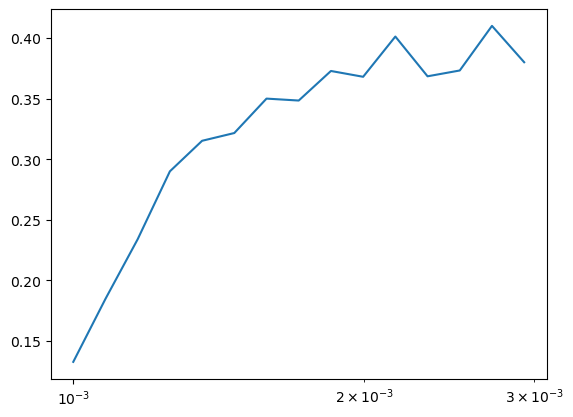

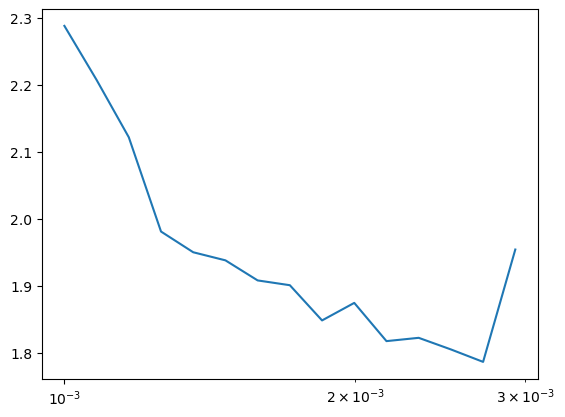

Epoch 1/15


2023-04-21 08:59:31.024779: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - ETA: 0s - loss: 2.2966 - accuracy: 0.1147

2023-04-21 09:00:39.793492: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


235/235 [==============================] - 76s 319ms/step - loss: 2.2966 - accuracy: 0.1147 - val_loss: 2.3030 - val_accuracy: 0.1000
Epoch 2/15
235/235 [==============================] - 81s 346ms/step - loss: 2.3034 - accuracy: 0.0967 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 3/15
235/235 [==============================] - 87s 371ms/step - loss: 2.3031 - accuracy: 0.0911 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 4/15
235/235 [==============================] - 80s 341ms/step - loss: 2.3032 - accuracy: 0.0923 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 5/15
235/235 [==============================] - 79s 337ms/step - loss: 2.3031 - accuracy: 0.0917 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 6/15
235/235 [==============================] - 81s 346ms/step - loss: 2.3031 - accuracy: 0.0939 - val_loss: 2.3026 - val_accuracy: 0.1000
Epoch 7/15
235/235 [==============================] - 81s 342ms/step - loss: 2.3032 - accuracy: 0.0963 - val_loss: 2.3026 - val_accuracy: 0.1

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense
from tensorflow.keras.activations import relu, softmax
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.models import Sequential
#from tensorflow.keras.callbacks import LearningRateScheduler
import matplotlib.pyplot as plt

tf.random.set_seed(42)

train_dir = "10_food_classes_all_data/train"
test_dir = "10_food_classes_all_data/test"

train_datagen_augmented = ImageDataGenerator(rescale=1./255,
                                             rotation_range=0.3,
                                             width_shift_range=0.3,
                                             height_shift_range=0.3,
                                             vertical_flip=True)
test_datagen = ImageDataGenerator(rescale=1./255)

train_data_augmented = train_datagen_augmented.flow_from_directory(train_dir,
                                               seed=42,
                                               target_size=(224,224),
                                               batch_size=32,
                                               shuffle=True)
test_data = test_datagen.flow_from_directory(test_dir,
                                             seed=42,
                                             target_size=(224,224),
                                             batch_size=32,
                                             shuffle=True)

model_exercise_final = Sequential([
    Conv2D(filters=20,
           kernel_size=2,
           activation=relu,
           input_shape=(224,224,3)),
    Conv2D(filters=20,
           kernel_size=2,
           activation=relu),
    MaxPool2D(pool_size=2),
    Conv2D(filters=20,
           kernel_size=2,
           activation=relu),
    Conv2D(filters=20,
           kernel_size=2,
           activation=relu),
    MaxPool2D(pool_size=2),
    Conv2D(filters=20,
           kernel_size=2,
           activation=relu),
    Conv2D(filters=20,
           kernel_size=2,
           activation=relu),
    MaxPool2D(pool_size=2),
    Flatten(),
    Dense(10,activation=softmax)
])

model_exercise_final.compile(loss=CategoricalCrossentropy(),
                             optimizer=Adam(),
                             metrics=['accuracy'])

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch:1e-3*10**(epoch/30))

history_exercise_final = model_exercise_final.fit(train_data_augmented,
                                                  epochs=15,
                                                  steps_per_epoch=len(train_data_augmented),
                                                  validation_data=test_data,
                                                  validation_steps=len(test_data),
                                                  callbacks=[lr_scheduler])

lrs = 1e-3*10**(tf.range(15)/30)
plt.semilogx(history_exercise_final.history["lr"],history_exercise_final.history["val_accuracy"])
plt.show()
plt.semilogx(history_exercise_final.history["lr"],history_exercise_final.history["val_loss"])
plt.show()

ideal_lr = history_exercise_final.history["lr"][tf.argmax(history_exercise_final.history["val_accuracy"])]

model_exercise_final_test = tf.keras.models.clone_model(model_exercise_final)
model_exercise_final_test.compile(loss=CategoricalCrossentropy(),
                             optimizer=Adam(learning_rate=ideal_lr),
                             metrics=['accuracy'])

history_exercise_final_test = model_exercise_final_test.fit(train_data_augmented,
                                                  epochs=15,
                                                  steps_per_epoch=len(train_data_augmented),
                                                  validation_data=test_data,
                                                  validation_steps=len(test_data))

In [ ]:
model_exercise_final_test.evaluate(test_data)

79/79 [==============================] - 7s 93ms/step - loss: 2.3026 - accuracy: 0.1000


[2.302614450454712, 0.10000000149011612]

In [ ]:
model_exercise_final_test.summary()

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_75 (Conv2D)          (None, 223, 223, 20)      260       
                                                                 
 conv2d_76 (Conv2D)          (None, 222, 222, 20)      1620      
                                                                 
 max_pooling2d_46 (MaxPoolin  (None, 111, 111, 20)     0         
 g2D)                                                            
                                                                 
 conv2d_77 (Conv2D)          (None, 110, 110, 20)      1620      
                                                                 
 conv2d_78 (Conv2D)          (None, 109, 109, 20)      1620      
                                                                 
 max_pooling2d_47 (MaxPoolin  (None, 54, 54, 20)       0         
 g2D)                                                

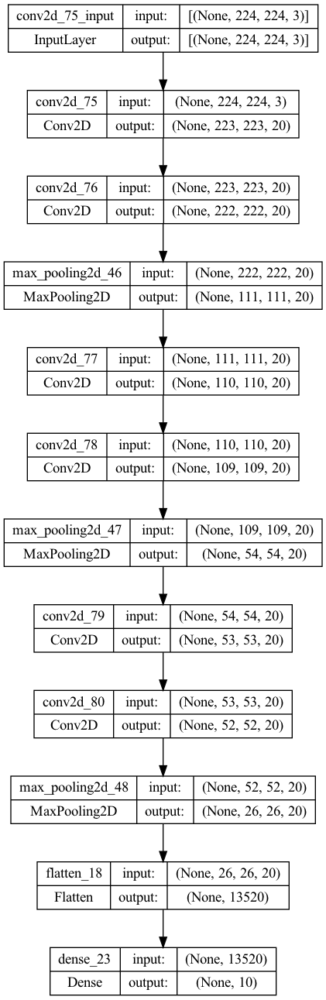

In [ ]:
tf.keras.utils.plot_model(model_exercise_final_test,show_shapes=True)